# 1. Modeling and Forecasting Electricity Expenses with Neural Networks

# 2. Contributions

While I was the sole contributor to this project extension, it's worth clarifying what all I worked on because a good deal of the code is used from my team's notebook. Everything up to the **Neural Networks** section is duplicated from my team's notebook, but most of this code is data preprocessing, cleaning and formatting. This includes reusing the following: loading in and manipulating the **Property Info** (used to connect addresses to features like Sqft, City, etc.), **CDHS** (Colorado Department of Human Services), **DPA** (Department of Personelle and Administration), and corresponding **weather data** for all the cities in our data.

# 3. Abstract

My group's project primarily focuses on modeling and forecasting electricity expenses using Autoregressive models such as **SARIMA, SARIMAX, and Auto-ARIMA**. However, even upon using Auto-ARIMA, certain buildings (with optimal parameters as to minimize AIC) still weren't modeling/forecasting well. With this said, I decided to incorporate Neural Networks as an alternative approach to model and forecast electricity expenses. I begin with a traditional Neural Network, using frameworks like **Tensorflow and Keras**, but shift my focus to **Recurrent Neural Networks (RNNs) and Long Short Term Memory (LSTM)** models - which are known for their improvements in capturing sequential patterns in data, and thus are better suited for time series forecasting.

# 4. Background

The original motivation of this project, prior to Math Clinic, was to transition Colorado state buildings to more efficient electricity usage through improvements like high efficiency heating and cooling, weatherization, and LED lighing. The Colorado Office of Sustainability has 28 million square feet of facilities (equivalent to nearly 500 football fields), which incurs substantial energy costs, making it a prime candidate for cost-saving improvements through efficiency upgrades. Ideally, our data analysis can help identify buildings most in need of funding, which can then be petitioned, reduce overall electricity costs, and contribute to environmental sustainability.

# Required Files

The required files include files for CDHS data, DPA data, and Property Info data. Another dependent file includes the data to connect property names in the CDHS data to a corresponding address (the notebook does require this data, but if this file doesn't exist, the notebook will run a webscraping script which will generate an excel file to connect property names to address). With this said, each of these files is loaded in with a shareable URL which allows anyone to run this notebook regardless of whether or not they have this data accessbile.

# 5. Methods

The data types present were primarily numeric, as most of these dataframes contain some variation of cost spent or weather for a building in a given month, season, or year. With this said, our property_info_df contains some non-numeric data, such as building descriptions, city, county, and building type (CDHS or DPA).

Furthermore, we load in four files, which are directly read into dataframes and the metrics can be seen above. The first being our CDHS data, which contains Month, Year expenses for different buildings across the state. Likewise, the DPA data has the same format but for different buildings. We also load in a dataframe that contains more information for these buildings, such as county, square footage, and a building description. Finally, we load in a facility addresses dataframe, which was generated from webscraping the CoOoS site, and allows us to connect generic property names to their corresponding address, which can then be connected to the property info dataframe.

From there, I begin to incorporate and finetune variations of Neural Networks in the subsequent section.

## Dependencies

### Installations

In [ ]:
!pip install thefuzz
!pip install meteostat

### Imports

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from thefuzz import process
import math
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from meteostat import Stations, Monthly
from datetime import datetime
import requests
import textwrap
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM
from sklearn.preprocessing import StandardScaler
from keras.regularizers import l2
import tensorflow as tf
from tensorflow.keras import layers, models

## Functions

### Data Processing/Cleaning Functions

In [ ]:
# Load and clean Property Info

def getPropertyInfoDF():
  file_id = '1N8m2Q-ZODUgClOmogjUgcs2kb1BmaYBJ'
  url = f'https://drive.google.com/uc?id={file_id}'

  # Read the Excel file
  property_df = pd.read_excel(url)

  property_df.columns = property_df.iloc[1]
  property_df = property_df[2:].reset_index(drop=True)

  property_df.dropna(subset=['Street Address'], inplace=True)

  property_df = property_df.dropna(axis=1, how="all") # Dropping Building(s) Sq Ftg since there is no data for any building

  property_df = property_df.drop('Zip Code', axis=1) # Dropping Zip codes for now since only one building as a zip code in the data
  property_df.columns.str.strip() # Removes any whitespace from columns names

  property_df.reset_index(drop=True, inplace=True)

  property_df = property_df.set_index('Street Address')

  return property_df

In [ ]:
# Return duplicates from df

def getDuplicates(data_frame):

  return data_frame[data_frame.index.duplicated(keep=False)]

In [ ]:
# Load Colorado Department of Human Services (CDHS) data

def getDataWithSheets(file_id, url):

  # Read the Excel file
  xls = pd.ExcelFile(url)

  # Load all sheets into a dictionary
  data_info = {
      sheet: (
          xls.parse(sheet)
          .drop(columns=xls.parse(sheet).columns[:2])  # Drop first two columns
          .dropna(how='all')  # Drop rows where all values are NaN
          .reset_index(drop=True)  # Reset index
      )
      for sheet in xls.sheet_names if sheet != "Report Overview"
  }

  # Process each DataFrame
  for sheet_name, df in data_info.items():
      # Set first row as column names and remove it from the DataFrame
      df.columns = df.iloc[0] + (f' {sheet_name}')
      df = df[1:].reset_index(drop=True)  # Drop the first row

      # Drop columns where all values are NaN again, in case there are any
      df.dropna(axis=1, how='all', inplace=True)

      df.columns = df.columns.fillna('')
      df.columns.str.strip() # removes any whitespace from column names

      df.columns.values[0] = 'Address'

      months_to_increment = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun']
      new_columns = []
      for col in df.columns:
          month_year = col.split()  # Split by space to separate month and year
          if len(month_year) == 2 and month_year[0] in months_to_increment:
              month, year = month_year[0], int(month_year[1])
              year += 1  # Increment year for months January to July
              new_columns.append(f'{month} {year}')
          else:
              new_columns.append(col)

      df.columns = new_columns

      # Save changes
      data_info[sheet_name] = df


      print(f'Sheet name: {sheet_name}')
      display(df)

  return data_info

In [ ]:
# Merge multiple df sheets to single df

def getMergedDF(data_with_sheets):
  merged_df = data_with_sheets['2015']

  # Merge the rest of the DataFrames using a for loop
  for year, df in data_with_sheets.items():
      if year != '2015':  # Skip the first year since it's already assigned
          merged_df = pd.merge(merged_df, df, on='Address')


  # Display the merged and cleaned DataFrame
  display(merged_df)

  return merged_df

In [ ]:
# Facility name to address linked using web scraping above

def getFacilityAddresses():
  file_id = '1Ripb6AUci8XHG4M20YNsuQj0ie7ArpHV'
  url = f'https://drive.google.com/uc?id={file_id}'

  # Read the Excel file
  facility_to_address = pd.read_excel(url)

  display(facility_to_address)

  facility_to_address.set_index("Facility Name", inplace=True)

  return facility_to_address

In [ ]:
# Convert facility name to address found in property info df

def convertCDHSFacilityNameToAddress(cdhs_merged_df, facility_to_address):
  for index, row in cdhs_merged_df.iloc[:-1].iterrows():
    facility_name = row['Address']

    if facility_name in facility_to_address.index:  # Ensure the key exists
          cdhs_merged_df.loc[index, "Address"] = facility_to_address.loc[facility_name, "Address"]

  display(cdhs_merged_df)

  return cdhs_merged_df

In [ ]:
# Link address in DPA/CDHS dfs to property info df (using similarity and some manual exclusions due to some incorrect matches)

def get_best_match(address, property_df_index, threshold=85):
    '''Finds the best match for an address from the property_df_index.'''
    best_match, score = process.extractOne(address, property_df_index)
    return best_match if score >= threshold else None

def match_addresses_to_property_info(input_df, property_info_df, address_column='Address', threshold=85):
    '''Matches addresses in input_df to property_info_df using fuzzy matching.'''

    # Create a copy to avoid modifying the original DataFrame
    new_df = input_df.copy()

    # Clean and normalize addresses
    new_df[address_column] = new_df[address_column].str.strip().str.lower()

    # Normalize property addresses and split them
    property_df_index = property_info_df.index.str.strip().str.lower()

    # Function to find best match across split addresses
    def get_best_match_for_property(address, property_df_index, threshold):
        '''Finds the best match by splitting each property address and matching.'''
        best_match = None
        best_score = 0

        for prop_address in property_df_index:
            split_addresses = [part.strip() for part in prop_address.split(',')]  # Split property address into parts
            for part in split_addresses:
                match, score = process.extractOne(address, split_addresses)  # Match against split parts
                if score >= threshold and score > best_score:
                    best_match = prop_address  # Store full original property address
                    best_score = score  # Update best score
        # print(f'Address {address} matched with {best_match}')
        return best_match  # Return the best found match or None

    # Apply fuzzy matching
    new_df['Matched Address'] = new_df[address_column].apply(
        lambda x: get_best_match_for_property(x, property_df_index, threshold)
    )

    # Replace address only if a match is found
    new_df.loc[new_df['Matched Address'].notnull(), address_column] = new_df['Matched Address']

    # Drop the helper column, but keep all rows
    new_df = new_df.drop(columns=['Matched Address'])

    return new_df

In [ ]:
'''
After matching addresses using your fuzzy function, this merges the final lot size (in sq ft) into the dataframe.
Prioritizes sq ft, but converts acres if needed.
'''

def add_lot_size_to_matched_df(matched_df, property_info_df):

    # Clean property_info_df index and parse sizes
    prop_df = property_info_df.copy()
    prop_df.index = prop_df.index.str.strip().str.lower()
    prop_df = prop_df[~prop_df.index.duplicated(keep='first')]

    # Clean up lot size fields
    def parse_size(val):
        if pd.isna(val): return np.nan
        if isinstance(val, str): val = val.replace(',', '').lower()
        val = ''.join(filter(lambda x: x.isdigit() or x == '.', str(val)))
        try: return float(val)
        except: return np.nan

    prop_df['Lot Size (sq. ft.)'] = prop_df['Lot Size (sq. ft.)'].apply(parse_size)
    prop_df['Lot Size (Acres)'] = prop_df['Lot Size (Acres)'].apply(parse_size)

    # Calculate final lot size in sq ft
    prop_df['Lot Size (Final SqFt)'] = prop_df['Lot Size (sq. ft.)']
    needs_acres = prop_df['Lot Size (Final SqFt)'].isna() & prop_df['Lot Size (Acres)'].notna()
    prop_df.loc[needs_acres, 'Lot Size (Final SqFt)'] = prop_df.loc[needs_acres, 'Lot Size (Acres)'] * 43560

    # Clean matched_df addresses to match the cleaned property index
    matched_df = matched_df.copy()
    matched_df['Address_cleaned'] = matched_df['Address'].str.strip().str.lower()

    # Merge lot size into matched_df
    merged_df = matched_df.merge(
        prop_df[['Lot Size (Final SqFt)']],
        how='left',
        left_on='Address_cleaned',
        right_index=True
    )

    return merged_df.drop(columns=['Address_cleaned'])

### Property Name to Address Webscraping Function

In [ ]:
# Should only run if you don't have spreadsheet linking CDHS to property info

!apt-get update
!apt-get install -y chromium-chromedriver
!pip install selenium

from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
import time

def webscrapingCDHSToPropertyInfo(cdhs_merged_df):
  # URL for CDHS Property Names to Property Info Addresses
  url = 'https://drive.google.com/uc?id=1Ripb6AUci8XHG4M20YNsuQj0ie7ArpHV'
  response = requests.get(url, timeout=5)

  # Can't access url, runs
  if response.status_code == 200:
    return True

  else:
    # Set up Chrome options
    chrome_options = Options()
    chrome_options.add_argument("--headless")
    chrome_options.add_argument("--no-sandbox")
    chrome_options.add_argument("--disable-dev-shm-usage")

    # Set up ChromeDriver
    driver = webdriver.Chrome(options=chrome_options)

    facility_names = []
    addresses = []

    # Iterate over all but the last row
    for index, row in cdhs_merged_df.iloc[:-1].iterrows():
      facility_name = row['Facility Name']

      # Open the webpage
      driver.get("https://app.energycap.com/app/embedded?key=ZW5jLXB1YmxpYy1kYXNoYm9hcmR8UHJvZHVjdGlvbg%3D%3D.Y29sb3JhZG9fZ2VvfDEwMjQ%3D.NmE0MzM4YmYtNjMyYS00Mjk3LTg5YmEtMDNlMDNmNzc3ODkx&dashboardId=3200&dashboardType=MAP")

      # Wait for page to load
      time.sleep(10)  # Adjust this if needed

      # Find the search box using its ID
      search_box = driver.find_element(By.ID, "searchableListBuildings_searchbox_input")

      # Enter search text
      search_box.send_keys(facility_name)

      # Press ENTER to search
      search_box.send_keys(Keys.RETURN)

      # Wait for results to load
      time.sleep(10)  # Adjust this based on website response time

      try:
          address_element = driver.find_element(By.CLASS_NAME, "text-caption-1")
          address = address_element.text
          address = address.split(',')[0]  # Get the first part of the address
          facility_names.append(facility_name)
          addresses.append(address)

          #print(address)
          #print(facility_name)


      except Exception as e:
          print("Address not found:", str(e))
          facility_names.append(facility_name)
          addresses.append(None)

    driver.quit()

    # Create a DataFrame with the results
    output_df = pd.DataFrame({
        'Facility Name': facility_names,
        'Address': addresses
    })

    # Save to Excel
    output_df.to_excel("Facility_addresses.xlsx", index=False)

Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:4 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:7 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Hit:10 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Fetched 257 kB in 2s (103 kB/s)
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package list

### Weather Data Functions

In [ ]:
# Load weather data for each city in properties

def loadWeatherData(df):
  # Clean up city column (ex: some cities are 'Grand Junction, Grand Junction, Grand Junction' due to aggregation)
  df['City'] = df['City'].str.split(',').str[0].str.strip()

  # Find unique cities
  cities = set(df['City'])

  # print(cities)

  results = []


  for city in cities:
    # Get Coordinates for the City
    state = "Colorado"
    url = f"https://nominatim.openstreetmap.org/search?city={city}&state={state}&country=USA&format=json"

    response = requests.get(url, headers={'User-Agent': 'YourAppName'})
    location_data = response.json()[0]

    lat = float(location_data['lat'])
    lon = float(location_data['lon'])

    # Find Nearest Weather Station
    stations = Stations()
    stations = stations.nearby(lat, lon)
    station = stations.fetch(1)

    station_id = station.index[0]
    # print(f"Nearest station: {station_id} - {station.loc[station_id]['name']}")

    # Set Time Period
    start = datetime(2015, 7, 1)
    end = datetime(2023, 12, 31)

    # Fetch Monthly Data
    monthly_data = Monthly(station_id, start, end).fetch()

    # Add year and month columns for grouping
    monthly_data['Year'] = monthly_data.index.year
    monthly_data['Month'] = monthly_data.index.month

    # Group by Year and Month, then calculate the average temperature
    monthly_avg_temp = monthly_data.groupby(['Year', 'Month'])['tavg'].mean().reset_index()

    # Save the result with the city, year, month, and average temperature
    for _, row in monthly_avg_temp.iterrows():
        results.append({
            'City': city,
            'Year': row['Year'],
            'Month': row['Month'],
            'Monthly Average Temp': (row['tavg'] * 9/5) + 32 # Convert to Fahrenheit
        })

  # Convert results to DataFrame
  results_df = pd.DataFrame(results)

  results_df['Month-Year'] = pd.to_datetime(results_df[['Year', 'Month']].assign(DAY=1))

  results_df['Month-Year'] = results_df['Month-Year'].dt.strftime('%B %Y')

  # Sort chronologically
  results_df = results_df.sort_values('Month-Year')

  # Pivot the data, so each row is a city and each column is a 'Month-Year'
  pivoted_df = results_df.pivot_table(index='City', columns='Month-Year', values='Monthly Average Temp')

  pivoted_df = pivoted_df.reindex(columns=sorted(pivoted_df.columns, key=lambda x: pd.to_datetime(x, format='%B %Y')))

  # Reset index for a clean format
  pivoted_df.reset_index(inplace=True)

  # Loop through and fill NaN values with average on city's month averages
  for index, row in pivoted_df.iterrows():
      for column in pivoted_df.columns[1:]:  # Skip 'City' column
          if pd.isna(row[column]):  # If the value is NaN
              target_month = column.split()[0]  # Extract the month name (e.g., "July")

              # Get data for the given city
              city_data = results_df[results_df['City'] == row['City']]

              # Get data for the target month across all years for the city
              month_data = city_data[city_data['Month-Year'].str.contains(target_month)]

              # Check if we have valid data for the given month
              valid_month_data = month_data['Monthly Average Temp'].dropna()

              if not valid_month_data.empty:
                  # Calculate the mean of available data for the target month across all years
                avg_temp = valid_month_data.mean()
                pivoted_df.at[index, column] = avg_temp  # Update the value in the pivoted DataFrame

              else:
                aggregated_avg = pivoted_df[column].dropna().mean()  # Aggregate the mean across all cities for the month
                pivoted_df.at[index, column] = aggregated_avg

  return pivoted_df

In [ ]:
def plotWeatherByCity(df):
      # Set figure size
    plt.figure(figsize=(30, 6))

    # Iterate through each row of the DataFrame
    for index, row in df.iterrows():

        x = row.index[1:]
        y = row[1:]

        plt.plot(x, y, '.-', label=row['City'])  # Plot each row with its address as the label

    plt.xlabel('Month Year')
    plt.ylabel('Weather (Fahrenheit)')
    plt.title('Weather (Month-year average) by City')
    plt.yscale('log')
    plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
    plt.legend()
    plt.show()

## Property Info

In [ ]:
property_info_df = getPropertyInfoDF()

display(property_info_df)

1,Agency/Department/Institution,Parcel ID or Schedule Number,Title Holder,County,City,Lot Size (sq. ft.),Lot Size (Acres),Description,Predominant Characteriscts
Street Address,,,,,,,,,
1406 W 17th St.,CDHS,52610020,State of Colorado Asylum,Pueblo,Pueblo,287060,6.59,"Pueblo Youth Services Support Building 52, Pue...",Youth Detention facility
1600 W 24th St.,CDHS,523400001,State of Colorado,Pueblo,Pueblo,6786893,155.7,NaN,NaN
198 E. Galatea Dr.,CDHS,612218013,Central Bank of Denver TR,Pueblo,Pueblo West,21250,0.487,PRC 198 Galatea Group Home,Residential Group Home
614 Clarion,CDHS,518014019,CENTRAL BANK OF DENVER TR ; c/oC/O CORPORATE T...,Pueblo,Pueblo West,18500,0.425,PRC 614 S Clarion,Residential Group Home
268 W. Harmony Dr.,CDHS,614213008,Central Bank of Denver TR,Pueblo,Pueblo West,12000,0.275,PRC 268 Harmony Group Home,Residential Group Home
...,...,...,...,...,...,...,...,...,...
690 Kipling St.,DPA,49-033-10-003,STATE OF COLORADO,Jefferson,Lakewood,NaN,2.08,DCS - Dale Tooley St. Office,Office type contents
700 Kipling St.,DPA,49-033-10-002,STATE OF COLORADO,Jefferson,Lakewood,NaN,2.33,DCS - Resources Park West,Office type contents
1881 Pierce St.,DPA,39-354-19-001,STATE OF COLORADO,Jefferson,Lakewood,NaN,17.04,DCS - Pierce Street,Office type contents


In [ ]:
# Finding duplicate addresses (Different adresses have different meters perhaps we need to keep duplicates that have different parcel id number)

getDuplicates(property_info_df)

1,Agency/Department/Institution,Parcel ID or Schedule Number,Title Holder,County,City,Lot Size (sq. ft.),Lot Size (Acres),Description,Predominant Characteriscts
Street Address,,,,,,,,,
1406 W 17th St.,CDHS,52610020,State of Colorado Asylum,Pueblo,Pueblo,287060,6.59,"Pueblo Youth Services Support Building 52, Pue...",Youth Detention facility
1600 W 24th St.,CDHS,523400001,State of Colorado,Pueblo,Pueblo,6786893,155.7,NaN,NaN
1406 W 17th St.,CDHS,526100020,State of Colorado Asylum,Pueblo,Pueblo,NaN,0.311,"Pueblo Youth Services Support Building, CMHIP ...","Other, Medical/Clinic"
1600 W 24th St.,CDHS,523400001,STATE OF COLORADO - DEPT OF NATURAL RESOURCES ...,Pueblo,Pueblo,NaN,152.13,"CMHIP Administration Building 125, CMHIP Bldg ...","Medical/Clinic, Office type contents, Garage O..."
2800 Riverside Pkwy,CDHS,2943-183-01-036,State of Colorado Department of Institutions,Mesa,Grand Junction,NaN,4.8,Vacant -GJRC Sudan Center,"Other ""Transfer of ownership could be affected..."
2800 Riverside Pkwy,CDHS,2943-183-01-038,State of Colorado Department of Institutions,Mesa,Grand Junction,NaN,2.49,GJRC Warehouse Procurement,"Warehouse Operations ""Transfer of ownership co..."
2800 Riverside Pkwy,CDHS,2943-183-01-037,State of Colorado Department of Institutions,Mesa,Grand Junction,NaN,2.08,NaN,"""Transfer of ownership could be affected by SB..."
2800 Riverside Pkwy,CDHS,2943-183-00-108,State of Colorado Department of Institutions,Mesa,Grand Junction,NaN,35.96,"GJRC Admin/Maintenance Shop, GJRC Bldg 17 Comp...","Warehouse Operations, Medical/Clinic, Other, S..."
851 E. 5th St.,CDHS,217716101003,STATE OF COLORADO DEPARTMENT OF SOCIAL SERVICES,Garfield,Rifle,NaN,1.92,Rifle Maintenance Building,Shop/Metalworking


In [ ]:
# Remove certain id, address pairs and duplicates
# Address CDHS issue from above
# Aggregate for '2800 Riverside Pkwy'
addresses_to_remove = ['1600 W 24th St.', '7862 W Mansfield', '1406 W 17th St.']
values_to_remove = [523400001, '59-022-00-003', 526100020]

rows_to_drop = []

# First, remove the rows where the index (address) is in addresses_to_remove and Parcel ID is in values_to_remove or NaN
for index, row in property_info_df.iterrows():
    if index in addresses_to_remove and (row['Parcel ID or Schedule Number'] in values_to_remove or \
                                         pd.isna(row['Parcel ID or Schedule Number'])):
        rows_to_drop.append(index)

property_info_df = property_info_df.drop(rows_to_drop)

target_address = '2800 Riverside Pkwy'

# Get rows with the target address (using .loc for index-based selection)
if target_address in property_info_df.index:
    targets = property_info_df.loc[target_address]  # Get rows

    # Ensure targets is a DataFrame (in case it's a single row)
    if isinstance(targets, pd.Series):
        targets = targets.to_frame().T

    # Merge only the target address rows
    df_merged = targets.groupby(level=0).agg(lambda x: ', '.join(x.astype(str)))

    # Drop original rows for the target address from the main DataFrame
    df_rest = property_info_df.drop(target_address, errors='ignore')

    # Concatenate the modified target rows with the rest of the DataFrame
    property_info_df = pd.concat([df_merged, df_rest])

# getDuplicates(property_info_df)

## Weather Data

In [ ]:
# Load in weather data for each city present in our dataset(July 2015 - December 2023)

weather_df = loadWeatherData(property_info_df)

weather_df

Month-Year,City,July 2015,August 2015,September 2015,October 2015,November 2015,December 2015,January 2016,February 2016,March 2016,...,March 2023,April 2023,May 2023,June 2023,July 2023,August 2023,September 2023,October 2023,November 2023,December 2023
0,Arvada,75.320,74.120000,68.360,53.96,43.28,38.240000,32.840,30.860,43.655,...,38.12,48.38,58.82,64.22,74.12,73.40,67.46,53.24,44.78,39.74
1,Aurora,76.604,74.540000,67.250,49.46,38.93,31.760000,30.632,29.912,43.655,...,38.12,47.30,59.54,65.48,75.38,74.12,66.38,51.80,40.28,33.44
2,Brighton,72.140,73.400000,69.080,56.12,38.12,29.840000,30.920,37.580,41.900,...,35.78,47.48,58.46,63.68,73.04,73.22,67.46,52.16,42.98,37.22
3,Centennial,70.700,71.780000,68.000,55.40,37.40,35.060000,32.000,38.480,43.655,...,38.12,46.40,57.38,62.42,72.14,71.60,65.66,51.26,42.80,36.50
4,Colorado Springs,69.980,70.880000,67.460,54.68,38.66,32.180000,32.180,37.220,42.260,...,37.94,46.94,58.28,63.68,72.32,71.42,66.02,51.80,42.62,37.04
5,Denver,76.604,74.540000,67.250,49.46,38.93,31.760000,30.632,29.912,43.655,...,38.12,47.30,59.54,65.48,75.38,74.12,66.38,51.80,40.28,33.44
6,Durango,66.920,68.642857,61.700,50.72,34.16,27.217143,19.220,28.760,43.655,...,38.12,45.50,55.94,61.70,74.66,70.70,60.98,50.72,36.32,30.02
7,Florence,78.350,75.830000,69.890,54.86,41.63,36.320000,32.720,35.600,43.655,...,38.12,50.72,61.16,66.74,78.26,76.46,69.62,54.86,44.78,37.94
8,Fort Lyon,77.900,77.750000,73.400,54.14,42.98,33.590000,32.900,40.820,43.655,...,38.12,51.98,63.14,68.36,76.64,77.18,69.26,54.32,42.80,35.24
9,Golden,75.320,74.120000,68.360,53.96,43.28,38.240000,32.840,30.860,43.655,...,38.12,48.38,58.82,64.22,74.12,73.40,67.46,53.24,44.78,39.74


## CDHS Data
In this file, we observe the monthly and total expenditures for electricity, natural gas, and diesel for each building owned by CDHS. The file contains a separate sheet for each fiscal year, starting from 2015 up to the present year.

We begin by loading the Excel file from Google Drive into the variable file_id and create a URL to access the data using the pandas library. Each sheet is then loaded into a dictionary called cdhs_info. For each sheet, we drop the first two columns and any rows where all values are NaN, and we reset the index. The sheet titled "Report Overview" is excluded from the processing since it is not necessary for our study.

Next, we use a for loop to iterate over each sheet in the property_info dictionary. For each sheet, the first row is set as the column names, and the row is removed from the DataFrame by resetting the index. Finally, we remove any columns where all values are NaN, just in case there are any left after the previous steps and remove rows that are all 0's.

### Data Processing

In [ ]:
# Colorado Department of Human Services (CDHS) data

file_id = '1QKXDwgpPyaKiKfFs45FZ7JhwwFkM7UqE'
url = f'https://drive.google.com/uc?id={file_id}'

cdhs_data_with_sheets = getDataWithSheets(file_id, url)

Sheet name: 2015


,Address,Jul 2015,Aug 2015,Sep 2015,Oct 2015,Nov 2015,Dec 2015,Jan 2016,Feb 2016,Mar 2016,Apr 2016,May 2016,Jun 2016,Total 2015
0,SMHMAS MASTER,11138.45152,11658.061664,11507.420192,17100.206368,24647.999008,33159.351072,32529.16328,27431.7096,19624.961216,23223.061664,17329.044835,11305.828009,240655.258428
1,NFLMAS MASTER,3463.333987,3631.052934,3292.717979,3468.833972,5304.934955,6371.019979,6131.457656,5018.536045,4860.539732,4241.076919,3580.156282,3347.697902,52711.358342
2,NLMMAS MASTER,964.705072,954.75968,996.217428,1760.486104,2693.766476,3159.155732,3081.408996,2635.477568,2624.148876,2176.74258,1776.81368,922.900136,23746.582328
3,WRCMAS MASTER,1492.661836,1413.017524,1390.68598,1566.295276,2181.870464,3137.137172,3317.741108,2571.503392,1823.530116,1295.788852,1132.026564,1074.892116,22397.1504
4,NPV100 PLATTE VALLEY YSC,653.49616,611.14144,588.16656,705.29632,1137.11328,1641.94832,1390.8326,1202.20272,1135.092,846.19456,801.54288,619.66304,11332.68988
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,NGYMAS MASTER,0,0,0,0,0,0,6.9,0,0,0,0,0,6.9
154,SMH031 TRUCK SCALE HOUSE,0,0,0.2,0,0,0,0.2,0,0,0,0,0,0.4
155,NRV0DCT DAY CARE TRAILIER-KIOSK,0,0,0,0,0,0,0,0,0,0,0,0,0
156,NFL Shed Soccer Field,0,0,0,0,0,0,0,0,0,0,0,0,0


Sheet name: 2016


,Address,Jul 2016,Aug 2016,Sep 2016,Oct 2016,Nov 2016,Dec 2016,Jan 2017,Feb 2017,Mar 2017,Apr 2017,May 2017,Jun 2017,Total 2016
0,SMHMAS MASTER,15009.590498,12289.626299,11835.041886,15877.188265,2564.190788,28024.034877,31063.406252,23353.967959,22359.185732,20084.53779,17093.030046,11616.871054,211170.671446
1,NFLMAS MASTER,3680.333004,3489.062838,3207.715591,3170.592076,4168.506298,6270.53917,6185.820096,4654.895397,4121.336104,4018.669858,3421.013076,3226.912154,49615.395662
2,NLMMAS MASTER,853.247596,969.575124,1086.5734,1600.540128,2284.597292,3341.647056,3209.809948,2536.885592,2342.246984,2160.598128,1911.525352,1108.522256,23405.768856
3,WRCMAS MASTER,1197.691152,1092.103704,992.429224,1309.259448,1566.055568,2204.619116,2252.879864,1562.970256,1525.950084,1367.549732,1201.374312,1011.631396,17284.513856
4,NPV100 PLATTE VALLEY YSC,525.9624,557.09424,615.9512,684.15424,1077.50688,1607.51568,1356.51264,1063.66528,901.25248,761.09376,779.7968,657.00096,10587.50656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,NGYMAS MASTER,0,0,0,0,0,0,0,0,0,0,0,0,0
154,SMH031 TRUCK SCALE HOUSE,0.2,0,0.2,0,0,0,0,0,0,0.4,0,0,0.8
155,NRV0DCT DAY CARE TRAILIER-KIOSK,0,0,0,0,0,0,0,0,0,0,0,0,0
156,NFL Shed Soccer Field,0,0,0,0,0,0,0,0,0,0,0,0,0


Sheet name: 2017


,Address,Jul 2017,Aug 2017,Sep 2017,Oct 2017,Nov 2017,Dec 2017,Jan 2018,Feb 2018,Mar 2018,Apr 2018,May 2018,Jun 2018,Total 2017
0,SMHMAS MASTER,11434.568441,11823.829016,5571.597583,19207.48518,22842.347186,29762.234248,30613.378706,29257.756082,24998.421266,19567.776763,12914.361117,10955.432692,228949.18828
1,NFLMAS MASTER,3457.598391,3304.937458,3192.45765,3847.144656,4374.638091,5740.454183,5563.653229,5237.503416,4415.530662,3844.594632,3269.851001,3439.279702,49687.643071
2,NLMMAS MASTER,759.183024,1000.39116,1300.006716,2212.009848,2420.75992,3032.664404,3044.424968,3019.994216,2526.38942,2192.2268,1728.08438,1268.40628,24504.541136
3,WRCMAS MASTER,1024.719,970.211728,1094.6786,1525.778912,1769.407564,2259.157924,2292.888088,1942.55144,1605.453052,1236.623372,1022.603484,798.887564,17542.960728
4,NPV100 PLATTE VALLEY YSC,637.89776,703.47328,621.50928,735.67104,1054.47024,1293.96368,1286.44044,1293.60992,915.30352,843.25296,648.11136,786.3212,10820.02468
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,NGYMAS MASTER,0,0,0,0,0,0,0,0,0,0,0,0,0
154,SMH031 TRUCK SCALE HOUSE,0.2,0.2,0,0,0.2,0,0,0.2,0,0,0.2,0,1
155,NRV0DCT DAY CARE TRAILIER-KIOSK,0,0,0,0,0,0,0,0,0,0,0,0,0
156,NFL Shed Soccer Field,0,0,0,0,0,0,0,0,0,0,0,0,0


Sheet name: 2018


,Address,Jul 2018,Aug 2018,Sep 2018,Oct 2018,Nov 2018,Dec 2018,Jan 2019,Feb 2019,Mar 2019,Apr 2019,May 2019,Jun 2019,Total 2018
0,SMHMAS MASTER,12019.31746,11540.637336,11882.922399,20268.867214,26562.615427,31089.395722,31256.066749,26861.700766,28392.696825,18861.439653,18832.756054,12968.736713,250537.152318
1,NFLMAS MASTER,3702.973253,3524.336215,3318.3689,3834.811383,4795.536217,5565.820126,5518.541385,5285.563432,4813.822167,3522.25304,3319.375406,3030.609932,50232.011456
2,NLMMAS MASTER,1016.394592,1188.3727,1273.386324,2065.32914,2771.793472,3134.589052,3115.057608,3094.827316,2942.384876,2194.127852,2202.827048,1368.252984,26367.342964
3,WRCMAS MASTER,843.166232,789.99192,756.329404,1118.758136,1605.950052,2202.485172,2469.417508,2164.76694,1869.33276,1407.699632,1013.447944,640.5796,16881.9253
4,NPV100 PLATTE VALLEY YSC,687.62464,667.70928,538.648,744.94656,1152.92992,1277.23888,1304.68912,1299.41152,1012.57952,818.05504,400.33648,634.0492,10538.21816
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,NGYMAS MASTER,0,0,0,0,0,0,0,0,0,0,0,0,0
154,SMH031 TRUCK SCALE HOUSE,0,0.2,0,0,0.2,0,0,0,0.2,0,0,0,0.6
155,NRV0DCT DAY CARE TRAILIER-KIOSK,0,0,0,0,0,0,0,0,0,0,0,0,0
156,NFL Shed Soccer Field,0,0,0,0,0,0,0,0,0,0,0,0,0


Sheet name: 2019


,Address,Jul 2019,Aug 2019,Sep 2019,Oct 2019,Nov 2019,Dec 2019,Jan 2020,Feb 2020,Mar 2020,Apr 2020,May 2020,Jun 2020,Total 2019
0,SMHMAS MASTER,12465.939009,11430.619448,11068.575033,22085.329838,24715.441487,26998.716557,27401.349427,19836.174162,19876.928,12559.0048,15590.6272,11848.9488,215877.653761
1,NFLMAS MASTER,3542.34927,3622.209802,3197.563171,4400.914544,5212.93514,5911.575042,5756.365069,5761.158839,4625.16746,4128.716792,3423.452712,3323.467796,52905.875637
2,NLMMAS MASTER,828.7119,871.897008,1176.643916,2372.014668,2787.96266,3067.281676,3054.734332,3139.469316,2595.238716,2236.803984,1554.723264,967.74686,24653.2283
3,WRCMAS MASTER,874.632784,1057.160796,937.008932,1158.283,1200.97536,1407.754148,1619.676,1483.676516,1085.796788,906.347272,674.640152,672.35356,13078.305308
4,NPV100 PLATTE VALLEY YSC,640.73792,752.40336,529.74064,1038.474,1158.36672,1476.17184,1314.26912,1258.7772,1086.3868,948.58336,672.09912,670.47448,11546.48456
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,NGYMAS MASTER,0,0,0,0,0,0,0,0,0,0,0,0,0
154,SMH031 TRUCK SCALE HOUSE,0.2,0,0.2,0,0,0.2,0,0,0,0,0.2,0,0.8
155,NRV0DCT DAY CARE TRAILIER-KIOSK,0,0,0,0,0,0,0,0,0,0,0,0,0
156,NFL Shed Soccer Field,0,0,0,0,0,0,0,0,0,0,0,0,0


Sheet name: 2020


,Address,Jul 2020,Aug 2020,Sep 2020,Oct 2020,Nov 2020,Dec 2020,Jan 2021,Feb 2021,Mar 2021,Apr 2021,May 2021,Jun 2021,Total 2020
0,SMHMAS MASTER,12002.1792,11759.3472,14725.6832,12348.704,20851.0336,23151.886632,28368.253652,19286.471468,24025.29746,19926.12768,16728.554479,11463.651804,214637.190375
1,NFLMAS MASTER,3889.92078,3810.609692,3640.399836,4383.6298,4421.775676,5674.83198,6214.3055,5353.774828,4829.122812,4055.760004,3558.82574,3612.552824,53445.509472
2,NLMMAS MASTER,757.258092,845.752848,1337.616908,2067.654416,2355.365832,3034.82788,2951.281656,2989.002152,2658.643324,2354.772428,1832.18786,960.652188,24145.015584
3,WRCMAS MASTER,685.479244,720.714096,735.249192,665.097608,854.132016,1390.272764,1397.419752,1127.9307,1037.975916,922.064632,790.408404,687.188928,11013.933252
4,NPV100 PLATTE VALLEY YSC,607.2212,584.2132,677.62192,888.03136,1031.74992,1435.8968,1207.34312,1315.29208,1080.3604,899.77784,741.99496,711.46808,11180.97088
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,NGYMAS MASTER,0,0,0,0,0,0,0,0,0,0,0,0,0
154,SMH031 TRUCK SCALE HOUSE,0.2,0.2,0,0,0,0,0,0,0,0,0.2,0,0.6
155,NRV0DCT DAY CARE TRAILIER-KIOSK,0,0,0,0,0,0,0,0,0,0,0,0,0
156,NFL Shed Soccer Field,0,0,0,0,0,0,0,0,0,0,0,0,0


Sheet name: 2021


,Address,Jul 2021,Aug 2021,Sep 2021,Oct 2021,Nov 2021,Dec 2021,Jan 2022,Feb 2022,Mar 2022,Apr 2022,May 2022,Jun 2022,Total 2021
0,SMHMAS MASTER,10723.359772,10369.564752,10344.48288,15778.189364,19769.819756,22846.197356,26464.340728,22048.745524,23645.669344,18405.951112,14409.501316,11120.46552,205926.287424
1,NFLMAS MASTER,3750.771772,3749.372312,3414.160412,4317.919544,4265.243416,5148.801288,6264.057604,5242.697476,4810.867204,3500.442436,3441.125144,3749.907412,51655.36602
2,NLMMAS MASTER,862.773052,920.76906,1124.93194,1722.05788,2115.283384,2613.006152,2833.05816,2573.894396,2351.550352,1899.21114,1509.971744,952.753408,21479.260668
3,WRCMAS MASTER,595.52414,560.514744,580.23836,702.172384,865.229532,1205.787404,1315.43226,1309.55538,979.263644,744.97818,429.98728,268.545872,9557.22918
4,NPV100 PLATTE VALLEY YSC,612.12344,622.17928,630.15104,674.0996,902.21576,1331.39856,1266.88336,1149.7448,1040.82376,771.25984,693.45616,564.85544,10259.19104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,NGYMAS MASTER,0,0,0,0,0,0,0,0,0,0,0,0,0
154,SMH031 TRUCK SCALE HOUSE,0.2,0,0.2,0,0,0.2,0,0,0.2,0,0.2,0,1
155,NRV0DCT DAY CARE TRAILIER-KIOSK,0.47768,0.713108,0.310492,0.303668,0.32414,0.406028,0.300256,0.098948,0.269548,0.269548,0.245664,0.2559,3.97498
156,NFL Shed Soccer Field,0,0,0,0,0,0,0,0,0,0,0,0,0


Sheet name: 2022


,Address,Jul 2022,Aug 2022,Sep 2022,Oct 2022,Nov 2022,Dec 2022,Jan 2023,Feb 2023,Mar 2023,Apr 2023,May 2023,Jun 2023,Total 2022
0,SMHMAS MASTER,10532.383684,10636.953772,10677.489956,15807.387848,23266.958492,26667.758628,28194.30684,23797.054564,23779.791572,9334.385636,13863.489072,11618.822316,208176.78238
1,NFLMAS MASTER,4150.975684,3744.733692,3208.424856,3639.779664,4633.463796,4594.513592,5550.201952,4068.577504,4392.376204,3200.015967,2919.585216,3076.954336,47179.602463
2,NLMMAS MASTER,755.745728,692.338832,1047.628264,1779.110768,2610.521344,3005.325176,3104.545508,2643.789472,2582.33026,2039.133953,1582.256932,1108.77642,22951.502657
3,WRCMAS MASTER,263.160736,365.585532,332.440224,567.463824,725.203076,946.705784,940.988692,857.709472,786.453568,641.873019,521.375754,471.262804,7420.222485
4,NPV100 PLATTE VALLEY YSC,499.81776,503.37104,427.36408,641.7268,1070.58232,1449.19288,1238.70256,1172.76056,1119.88272,753.3404,411.70504,388.87,9677.31616
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,NGYMAS MASTER,0,0,0,0,0,0,0,0,0,0,0,0,0
154,SMH031 TRUCK SCALE HOUSE,0,0.2,0,0,0.2,0,0.2,0,0,0.2,0,0,0.8
155,NRV0DCT DAY CARE TRAILIER-KIOSK,0.23884,0.249076,0.296844,0.29002,0.327552,0.368496,0.344612,0.310492,0.279784,0.269548,0.262724,0,3.237988
156,NFL Shed Soccer Field,0,0,0,0,0,0,0,0,0,0.027296,0.044356,0.047768,0.11942


Sheet name: 2023


,Address,Jul 2023,Aug 2023,Sep 2023,Oct 2023,Nov 2023,Dec 2023,Jan 2024,Feb 2024,Mar 2024,Apr 2024,May 2024,Jun 2024,Total 2023
0,SMHMAS MASTER,11229.324276,10809.557118,10318.960893,15431.985792,21997.659163,25840.166732,28656.238729,22781.305965,22431.911093,18758.20481,16097.314245,11388.724423,215741.353239
1,NFLMAS MASTER,3636.657258,3455.753853,3071.930573,3200.282535,3321.152538,3773.964551,4904.952487,3549.86593,3342.079467,2755.428075,2746.348595,4164.368076,41922.783938
2,NLMMAS MASTER,769.769264,844.369692,1071.557608,1689.480256,2258.241337,2634.940725,3189.915389,2602.198343,2523.928818,2075.970856,1810.857024,826.138854,22297.368166
3,WRCMAS MASTER,344.884894,203.839704,298.090176,715.901673,930.670069,1019.231106,971.622274,844.053099,835.26222,162.13541,83.948848,77.097552,6486.737025
4,NPV100 PLATTE VALLEY YSC,359.48616,385.08304,294.73512,277.7084,1103.45656,1127.43008,1368.00884,1102.3688,887.98072,689.8876,630.06624,492.7224,8718.93396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,NGYMAS MASTER,0,0,0,0,0,0,20.7966,0,0,0,0,0,20.7966
154,SMH031 TRUCK SCALE HOUSE,0.2,0,0,0.2,0,0,0.2,0,0.2,0,0,0,0.8
155,NRV0DCT DAY CARE TRAILIER-KIOSK,0,0,0,0,0,0,0,0,0,0,0,0,0
156,NFL Shed Soccer Field,0.044356,0.044356,0.105772,0.040944,0.037532,0.037532,0.03412,0.037532,0.037532,0.037532,0.044356,0.044356,0.54592


Sheet name: 2024


,Address,Jul 2024,Aug 2024,Sep 2024,Oct 2024,Nov 2024,Dec 2024,Jan 2025,Feb 2025,Mar 2025,Apr 2025,May 2025,Jun 2025,Total 2024
0,SMHMAS MASTER,11855.333885,11940.17068,12602.595117,15514.995353,22176.362195,22921.103748,113.85,0,0,0,0,0,97124.410978
1,NFLMAS MASTER,3983.749125,3867.679529,3442.18113,2875.756654,3423.891053,3648.955144,55.2552,0,0,0,0,0,21297.467835
2,NLMMAS MASTER,782.555627,831.610687,978.274671,1511.321084,2654.106484,2714.129093,0,0,0,0,0,0,9471.997646
3,WRCMAS MASTER,89.476288,67.666784,51.7771,51.275536,51.524612,48.699476,0,0,0,0,0,0,360.419796
4,NPV100 PLATTE VALLEY YSC,498.28592,435.61232,322.79096,664.07136,1041.44976,1344.032956,0,0,0,0,0,0,4306.243276
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,NGYMAS MASTER,0,0,0,0,0,0,0,0,0,0,0,0,0
154,SMH031 TRUCK SCALE HOUSE,0.2,0,0,0.2,0,0,0.5,0,0,0,0,0,0.9
155,NRV0DCT DAY CARE TRAILIER-KIOSK,0,0,0,0,0,0,0,0,0,0,0,0,0
156,NFL Shed Soccer Field,0.044356,0.044356,0.040944,0.044356,0.03412,0.037532,0,0,0,0,0,0,0.245664


In [ ]:
cdhs_data_merged = getMergedDF(cdhs_data_with_sheets)

,Address,Jul 2015,Aug 2015,Sep 2015,Oct 2015,Nov 2015,Dec 2015,Jan 2016,Feb 2016,Mar 2016,...,Oct 2024,Nov 2024,Dec 2024,Jan 2025,Feb 2025,Mar 2025,Apr 2025,May 2025,Jun 2025,Total 2024
0,SMHMAS MASTER,11138.45152,11658.061664,11507.420192,17100.206368,24647.999008,33159.351072,32529.16328,27431.7096,19624.961216,...,15514.995353,22176.362195,22921.103748,113.85,0,0,0,0,0,97124.410978
1,NFLMAS MASTER,3463.333987,3631.052934,3292.717979,3468.833972,5304.934955,6371.019979,6131.457656,5018.536045,4860.539732,...,2875.756654,3423.891053,3648.955144,55.2552,0,0,0,0,0,21297.467835
2,NLMMAS MASTER,964.705072,954.75968,996.217428,1760.486104,2693.766476,3159.155732,3081.408996,2635.477568,2624.148876,...,1511.321084,2654.106484,2714.129093,0,0,0,0,0,0,9471.997646
3,WRCMAS MASTER,1492.661836,1413.017524,1390.68598,1566.295276,2181.870464,3137.137172,3317.741108,2571.503392,1823.530116,...,51.275536,51.524612,48.699476,0,0,0,0,0,0,360.419796
4,NPV100 PLATTE VALLEY YSC,653.49616,611.14144,588.16656,705.29632,1137.11328,1641.94832,1390.8326,1202.20272,1135.092,...,664.07136,1041.44976,1344.032956,0,0,0,0,0,0,4306.243276
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,NGYMAS MASTER,0,0,0,0,0,0,6.9,0,0,...,0,0,0,0,0,0,0,0,0,0
154,SMH031 TRUCK SCALE HOUSE,0,0,0.2,0,0,0,0.2,0,0,...,0.2,0,0,0.5,0,0,0,0,0,0.9
155,NRV0DCT DAY CARE TRAILIER-KIOSK,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
156,NFL Shed Soccer Field,0,0,0,0,0,0,0,0,0,...,0.044356,0.03412,0.037532,0,0,0,0,0,0,0.245664


In [ ]:
# Ensure excel file exists, will be printed in next code cell

webscrapingCDHSToPropertyInfo(cdhs_data_merged)

True

In [ ]:
# Load in Facility_addresses

facility_to_address = getFacilityAddresses()

,Facility Name,Address
0,SMHMAS MASTER,1600 W. 24TH ST.
1,NFLMAS MASTER,4112 S. Knox Ct.
2,NLMMAS MASTER,2901 Ford St
3,WRCMAS MASTER,2800 RIVERSIDE PKWY.
4,NPV100 PLATTE VALLEY YSC,2200 O St.
...,...,...
152,SMHMASSOC - SOUTH CAMPUS MASTER,1600 W. 24TH ST.
153,NGYMAS MASTER,2844 Downing St.
154,SMH031 TRUCK SCALE HOUSE,1600 W. 24TH ST.
155,NRV0DCT DAY CARE TRAILIER-KIOSK,28101 E. Quincy Ave.


In [ ]:
# Convert Facility Name to Address

cdhs_data_merged = convertCDHSFacilityNameToAddress(cdhs_data_merged, facility_to_address)

,Address,Jul 2015,Aug 2015,Sep 2015,Oct 2015,Nov 2015,Dec 2015,Jan 2016,Feb 2016,Mar 2016,...,Oct 2024,Nov 2024,Dec 2024,Jan 2025,Feb 2025,Mar 2025,Apr 2025,May 2025,Jun 2025,Total 2024
0,1600 W. 24TH ST.,11138.45152,11658.061664,11507.420192,17100.206368,24647.999008,33159.351072,32529.16328,27431.7096,19624.961216,...,15514.995353,22176.362195,22921.103748,113.85,0,0,0,0,0,97124.410978
1,4112 S. Knox Ct.,3463.333987,3631.052934,3292.717979,3468.833972,5304.934955,6371.019979,6131.457656,5018.536045,4860.539732,...,2875.756654,3423.891053,3648.955144,55.2552,0,0,0,0,0,21297.467835
2,2901 Ford St,964.705072,954.75968,996.217428,1760.486104,2693.766476,3159.155732,3081.408996,2635.477568,2624.148876,...,1511.321084,2654.106484,2714.129093,0,0,0,0,0,0,9471.997646
3,2800 RIVERSIDE PKWY.,1492.661836,1413.017524,1390.68598,1566.295276,2181.870464,3137.137172,3317.741108,2571.503392,1823.530116,...,51.275536,51.524612,48.699476,0,0,0,0,0,0,360.419796
4,2200 O St.,653.49616,611.14144,588.16656,705.29632,1137.11328,1641.94832,1390.8326,1202.20272,1135.092,...,664.07136,1041.44976,1344.032956,0,0,0,0,0,0,4306.243276
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,2844 Downing St.,0,0,0,0,0,0,6.9,0,0,...,0,0,0,0,0,0,0,0,0,0
154,1600 W. 24TH ST.,0,0,0.2,0,0,0,0.2,0,0,...,0.2,0,0,0.5,0,0,0,0,0,0.9
155,28101 E. Quincy Ave.,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
156,3631 West Princeton Circle,0,0,0,0,0,0,0,0,0,...,0.044356,0.03412,0.037532,0,0,0,0,0,0,0.245664


In [ ]:
# Remove certain rows that don't properly match

addresses_to_remove = ['4140 s. lowell blvd', '1425 w. rio grande ave.', '4106-4108-4112-4116-4118',
                       '4103 s. stuart st.', '308 cedar st.', '28101 e. quincy ave.', '195 desert st.']

cdhs_data_merged = cdhs_data_merged[~cdhs_data_merged['Address'].isin(addresses_to_remove)]


In [ ]:
# Match CDHS Addresses to Property info:

matched_cdhs_df = match_addresses_to_property_info(cdhs_data_merged, property_info_df, address_column='Address', threshold=85)
display(matched_cdhs_df)



,Address,Jul 2015,Aug 2015,Sep 2015,Oct 2015,Nov 2015,Dec 2015,Jan 2016,Feb 2016,Mar 2016,...,Oct 2024,Nov 2024,Dec 2024,Jan 2025,Feb 2025,Mar 2025,Apr 2025,May 2025,Jun 2025,Total 2024
0,270 w. john powell blvd.,11138.45152,11658.061664,11507.420192,17100.206368,24647.999008,33159.351072,32529.16328,27431.7096,19624.961216,...,15514.995353,22176.362195,22921.103748,113.85,0,0,0,0,0,97124.410978
1,"3520 w. oxford ave., 3525 w. oxford ave, 3526 ...",3463.333987,3631.052934,3292.717979,3468.833972,5304.934955,6371.019979,6131.457656,5018.536045,4860.539732,...,2875.756654,3423.891053,3648.955144,55.2552,0,0,0,0,0,21297.467835
2,"2901 ford st.,",964.705072,954.75968,996.217428,1760.486104,2693.766476,3159.155732,3081.408996,2635.477568,2624.148876,...,1511.321084,2654.106484,2714.129093,0,0,0,0,0,0,9471.997646
3,2800 riverside pkwy,1492.661836,1413.017524,1390.68598,1566.295276,2181.870464,3137.137172,3317.741108,2571.503392,1823.530116,...,51.275536,51.524612,48.699476,0,0,0,0,0,0,360.419796
4,2200 o st.,653.49616,611.14144,588.16656,705.29632,1137.11328,1641.94832,1390.8326,1202.20272,1135.092,...,664.07136,1041.44976,1344.032956,0,0,0,0,0,0,4306.243276
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,2844 downing st.,0,0,0,0,0,0,6.9,0,0,...,0,0,0,0,0,0,0,0,0,0
154,270 w. john powell blvd.,0,0,0.2,0,0,0,0.2,0,0,...,0.2,0,0,0.5,0,0,0,0,0,0.9
155,2882 elm ave.,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
156,"3610 w. princeton circle, 3620 w. princeton ci...",0,0,0,0,0,0,0,0,0,...,0.044356,0.03412,0.037532,0,0,0,0,0,0,0.245664


In [ ]:
# Create a copy of the DataFrame to avoid fragmentation

matched_cdhs_df = matched_cdhs_df.copy()

# Group by 'Address' and sum the numerical columns
matched_cdhs_df = matched_cdhs_df.groupby('Address', as_index=False).sum()


# Display the updated DataFrame
display(matched_cdhs_df)


,Address,Jul 2015,Aug 2015,Sep 2015,Oct 2015,Nov 2015,Dec 2015,Jan 2016,Feb 2016,Mar 2016,...,Oct 2024,Nov 2024,Dec 2024,Jan 2025,Feb 2025,Mar 2025,Apr 2025,May 2025,Jun 2025,Total 2024
0,10285 ridge road,360.60168,338.758,319.986852,545.569584,996.085364,1294.363228,1242.316464,968.712204,938.075552,...,514.45402,1038.681697,1095.209952,0,0,0,0,0,0,3777.690091
1,1034 xenon st.,143.945852,117.314424,103.623688,106.798096,127.233268,161.904128,132.079416,123.37936,134.26148,...,101.3383,121.723572,139.60592,0,0,0,0,0,0,629.165292
2,13500 e. fremont pl.,559.19744,526.35552,583.54432,806.52128,1092.29408,1348.5136,1328.34916,1108.49824,1040.93184,...,618.588212,1075.757466,1168.351152,246.48288,0,0,0,0,0,4433.603748
3,1427 w. rio grande st.,86.528912,65.861496,30.148476,71.416108,263.296796,371.627636,319.899232,224.984312,183.196044,...,56.211284,154.626104,173.312312,0,0,0,0,0,0,454.362972
4,15038 w. 49th pl.,19.82602,20.406316,21.29426,24.27646,38.018996,59.984336,75.213224,56.102476,48.723716,...,19.74888,36.975152,44.474384,55.823716,0,0,0,0,0,200.833716
5,17767 w. 59th pl.,15.37106,14.872908,13.327272,9.973276,7.141316,8.792724,9.321584,6.731876,7.9329,...,5.391812,20.772136,32.602304,52.43614,0,0,0,0,0,126.583688
6,183 s wiggins dr.,2.19184,2.748792,5.154564,10.20182,38.346944,40.022008,40.143532,25.47424,26.865056,...,9.813108,64.94956,67.866364,0,0,0,0,0,0,145.498524
7,1852 independence st.,4.224596,4.4532,4.112,32.68368,19.00782,51.095992,34.313592,26.601252,35.318996,...,23.824028,42.111148,48.316664,0,0,0,0,0,0,157.908716
8,192 bromley business parkway,0,0,0,0,0,0,0,0,0,...,321.40576,416.53936,500.80928,445.5,0,0,0,0,0,2736.17456
9,1933 e. bridge st.,145.591024,151.968108,146.937512,133.89252,239.476708,400.518424,447.4586,297.596272,265.873552,...,15.707592,75.682628,43.882884,7.185672,0,0,0,0,0,147.65946


In [ ]:
# Filter the dataframe to exclude columns that contain '2024', '2025', or 'Total'

matched_cdhs_filtered_by_month_year = matched_cdhs_df.loc[:, ~matched_cdhs_df.columns.str.contains('Total|2024|2025')]  # Exclude columns with 'Total', '2024', '2025'

# Exclude the last row
matched_cdhs_filtered_by_month_year = matched_cdhs_filtered_by_month_year.iloc[:-1]  # Exclude the last row

In [ ]:
# Properly initialize DF

cdhs_with_lot_size = add_lot_size_to_matched_df(matched_cdhs_filtered_by_month_year, property_info_df)

normalized_cdhs_with_lot_size = cdhs_with_lot_size.copy()

# Identify only the date columns (excluding 'Address' and 'Lot Size')
date_columns_cdhs = normalized_cdhs_with_lot_size.columns.drop(['Address', 'Lot Size (Final SqFt)'])

# Normalize each value by square footage
normalized_cdhs_with_lot_size[date_columns_cdhs] = normalized_cdhs_with_lot_size[date_columns_cdhs].div(normalized_cdhs_with_lot_size['Lot Size (Final SqFt)'], axis=0)

# Drop rows with any 0 values in date columns
normalized_cdhs_with_lot_size = normalized_cdhs_with_lot_size[
    ~(normalized_cdhs_with_lot_size[date_columns_cdhs] == 0).any(axis=1)
]

# Calculate average normalized cost across all months for each building
normalized_cdhs_with_lot_size['Average Cost/SqFt'] = normalized_cdhs_with_lot_size[date_columns_cdhs].mean(axis=1)

In [ ]:
#Prepare the dataframe so we can treat time series columns (e.g. "Jan 2016", "Feb 2016", etc.) as datetime objects

# List all non-date columns
non_date_columns = ['Address', 'Lot Size (Final SqFt)', 'Average Cost/SqFt', 'Cost Growth Rate (slope)', 'R² Score']

# Apply conversion only to likely date columns
normalized_cdhs_with_lot_size.columns = [
    pd.to_datetime(col) if col not in non_date_columns else col
    for col in normalized_cdhs_with_lot_size.columns
]

## DPA Data
In this file, we observe the monthly and total expenditures for electricity, natural gas, and diesel for each building owned by DPA. The file contains a separate sheet for each fiscal year, starting from 2015 up to the present year. We use the exact process as in the previous file to load each sheet into into a dictionary called dpa_info.

### Data Processing

In [ ]:
# Department of Personnel and Administration (DPA) data

file_id = '1dVGm7cUTZXrmjSntkV_gE2mtWcO48yhw'
url = f'https://drive.google.com/uc?id={file_id}'

dpa_data_with_sheets = getDataWithSheets(file_id, url)

Sheet name: 2015


,Address,Jul 2015,Aug 2015,Sep 2015,Oct 2015,Nov 2015,Dec 2015,Jan 2016,Feb 2016,Mar 2016,Apr 2016,May 2016,Jun 2016,Total 2015
0,690 Kipling,1796.615804,1832.282488,1888.232772,1695.033188,1675.439132,2076.079468,2166.922544,1902.456036,1876.312492,1635.83048,1716.873532,1678.583908,21940.661844
1,1525 Sherman,978.884814,869.627699,812.883068,718.225482,1787.396393,1151.474646,1275.247658,1129.493603,1035.428085,1014.390753,778.497986,910.181212,12461.731399
2,1881 Pierce,405.6502,402.128988,796.454704,0,914.80188,762.54938,1996.171596,865.506548,666.50052,679.769524,609.69802,498.932096,8598.163456
3,200 E. Colfax,760.323939,711.513572,665.086147,585.593576,625.333413,636.851984,567.529902,574.194767,582.813887,570.019707,597.352897,685.375537,7561.989328
4,1313 Sherman,633.603282,592.927977,554.238456,487.994647,521.111178,530.709986,472.941585,478.495639,485.67824,475.016423,497.794081,571.146281,6301.657775
5,1575 Sherman,506.882626,474.342381,443.390765,390.395718,416.888942,424.567989,378.353268,382.79651,388.542592,380.013137,398.235265,456.917024,5041.326217
6,200 E. 14th Ave,337.92175,316.228254,295.593843,260.263811,484.825961,469.845326,476.335512,453.797674,399.928395,385.642092,342.190176,323.811349,4546.384143
7,1375 Sherman,338.034346,316.351086,295.593843,260.396879,278.243277,283.209102,252.409524,255.368274,259.171699,253.485396,265.613008,304.720533,3362.596967
8,201 E. Colfax,422.61032,395.51051,369.74138,325.602724,347.721355,354.461762,315.997262,319.33488,324.072101,316.957398,331.862721,380.979143,4204.851556
9,1001 E 62nd Ave,183.45812,183.87592,189.41314,157.331212,199.832176,308.888368,362.720072,260.350352,248.06716,177.161512,186.505168,199.035436,2656.638636


Sheet name: 2016


,Address,Jul 2016,Aug 2016,Sep 2016,Oct 2016,Nov 2016,Dec 2016,Jan 2017,Feb 2017,Mar 2017,Apr 2017,May 2017,Jun 2017,Total 2016
0,690 Kipling,1628.864848,1790.23468,1770.73506,1752.193416,1646.125716,2104.049676,1696.642768,1758.647568,0,1815.104884,1750.607244,1816.999556,19530.205416
1,1525 Sherman,963.19012,805.70695,774.306178,723.240889,749.888227,1002.092232,660.356023,1192.143332,942.598723,1077.59786,971.555993,917.111428,10779.787955
2,1881 Pierce,484.164756,503.50548,465.60922,532.566544,350.535232,739.191468,446.047348,786.400492,736.561908,491.9162,475.013836,465.016324,6476.528808
3,200 E. Colfax,776.691916,659.214778,633.523237,591.742546,569.035822,615.102735,540.291292,585.689999,536.64441,538.934612,549.618539,636.882078,7233.371964
4,1313 Sherman,647.243263,549.345648,527.936031,493.118789,474.196519,512.585613,450.242743,488.074999,447.203674,449.112177,458.01545,530.735065,6027.809971
5,1575 Sherman,517.794612,439.476518,422.348825,394.49503,379.357215,410.06849,360.194194,390.459999,357.76294,359.289742,366.41236,424.588052,4822.247977
6,200 E. 14th Ave,345.296408,293.084346,281.565883,263.196687,292.10481,380.978994,516.329463,486.806666,379.708626,330.426494,323.374907,314.858701,4207.731985
7,1375 Sherman,345.298768,293.096942,281.688715,263.129755,253.05835,273.54277,240.303475,260.477266,238.65193,239.669798,244.397739,283.167885,3216.483393
8,201 E. Colfax,431.703642,366.455624,352.206429,329.018818,316.444916,342.051294,300.161829,325.721121,298.41898,299.687902,305.582473,354.038332,4021.49136
9,1001 E 62nd Ave,204.88292,195.45272,189.14146,170.352652,178.610256,320.534344,353.007592,262.022032,248.39676,207.009032,221.825648,212.921676,2764.157092


Sheet name: 2017


,Address,Jul 2017,Aug 2017,Sep 2017,Oct 2017,Nov 2017,Dec 2017,Jan 2018,Feb 2018,Mar 2018,Apr 2018,May 2018,Jun 2018,Total 2017
0,690 Kipling,1847.27892,1711.93378,1780.12702,1772.079924,1802.773552,1652.629464,3547.043184,1818.53502,1558.453424,1548.600544,1599.6134,1738.860972,22377.929204
1,1525 Sherman,832.281424,741.633821,762.699783,716.434932,978.215025,2218.755529,1453.871326,1575.014292,1090.227286,947.165755,709.592662,731.971622,12757.863457
2,1881 Pierce,378.172456,378.864864,357.8766,354.742616,679.2637,678.730684,1395.48924,1161.211044,602.570716,506.88086,395.647916,431.485524,7320.93622
3,200 E. Colfax,676.702984,606.791308,624.027095,526.528581,531.175929,597.154524,513.712904,560.220784,520.631416,517.962891,566.093996,597.004054,6838.006466
4,1313 Sherman,563.919153,505.659423,520.022579,438.773817,442.646607,497.628769,428.094086,466.850653,433.859513,431.635743,471.744996,497.503378,5698.338717
5,1575 Sherman,451.135323,404.527539,416.018063,351.019054,354.117286,398.103016,342.47527,373.480523,347.087611,345.308594,377.395997,398.002703,4558.670979
6,200 E. 14th Ave,300.756881,269.685026,277.345376,259.112703,331.378191,378.20201,601.316846,445.887015,373.39174,329.40573,253.197331,265.335135,4085.013984
7,1375 Sherman,300.859241,269.797622,277.468208,234.145771,236.231731,265.565786,228.490858,249.300919,231.535044,230.328562,251.706515,265.437495,3040.867752
8,201 E. Colfax,376.154234,337.331475,346.930795,292.788838,295.425291,332.10395,285.733846,311.516965,289.51946,287.996001,314.711621,331.877052,3802.089528
9,1001 E 62nd Ave,221.5386,217.35688,207.4229,191.105772,228.29232,276.823376,352.825936,292.259792,240.24924,223.844552,201.456728,223.603116,2876.779212


Sheet name: 2018


,Address,Jul 2018,Aug 2018,Sep 2018,Oct 2018,Nov 2018,Dec 2018,Jan 2019,Feb 2019,Mar 2019,Apr 2019,May 2019,Jun 2019,Total 2018
0,690 Kipling,1631.604752,1879.020696,1907.228072,1581.801328,1744.013856,1984.436748,1712.90388,1926.606828,1483.035772,1591.430948,1686.121808,1532.863348,20661.068036
1,1525 Sherman,780.245242,710.665417,750.036455,1090.839782,1460.449905,1785.189052,1439.143119,1878.63704,1279.552192,1022.032541,940.099456,692.000411,13828.890612
2,1881 Pierce,418.333316,363.963352,353.787224,655.21558,825.324904,963.487332,971.383564,1140.83818,721.767292,624.494956,494.884192,363.206288,7896.68618
3,200 E. Colfax,638.38247,581.453523,594.684372,512.950731,514.268104,554.47286,481.126188,552.303033,487.433611,520.635715,535.908646,548.100336,6521.719589
4,1313 Sherman,531.985392,484.544603,495.57031,427.458943,428.556754,462.060717,400.93849,460.252528,406.194676,433.863096,446.590538,456.75028,5434.766327
5,1575 Sherman,425.588314,387.635682,396.456248,341.967154,342.845403,369.648574,320.750792,368.202022,324.955741,347.090477,357.272431,365.400224,4347.813062
6,200 E. 14th Ave,283.725542,258.523788,274.904165,337.678103,443.363602,537.832382,419.933861,492.468015,399.137161,324.693651,309.68162,243.900149,4325.842039
7,1375 Sherman,283.725542,258.423788,264.437233,228.131643,228.727378,246.606394,214.004461,245.611319,216.780465,231.516483,238.290804,243.702509,2899.958019
8,201 E. Colfax,354.88212,323.278811,330.653167,285.286532,286.032054,308.391914,267.630115,307.118214,271.076235,289.480904,297.941982,304.916451,3626.688499
9,1001 E 62nd Ave,226.37076,197.23464,198.4517,205.477932,570.134256,370.480584,2.408872,365.073072,287.70588,208.049352,203.192688,175.972076,3010.551812


Sheet name: 2019


,Address,Jul 2019,Aug 2019,Sep 2019,Oct 2019,Nov 2019,Dec 2019,Jan 2020,Feb 2020,Mar 2020,Apr 2020,May 2020,Jun 2020,Total 2019
0,690 Kipling,1500.184748,1654.332084,1519.139796,1703.286736,1752.927744,0,1586.909052,1448.981992,1391.024312,1395.20774,1492.5351,1373.947316,16818.47662
1,1525 Sherman,816.220414,779.306942,824.754215,1388.791594,2008.540382,1957.501687,1803.359842,1920.110594,1347.216738,977.288834,700.425117,656.914981,15180.43134
2,1881 Pierce,381.138252,363.229204,418.14498,843.760028,1038.180108,0,779.92206,735.27384,600.622796,399.838136,313.101936,280.675608,6153.886948
3,200 E. Colfax,667.816703,637.61477,636.917085,513.729486,559.587585,538.528653,518.285325,530.763214,451.731876,424.9545,485.202368,479.794075,6444.92564
4,1313 Sherman,556.513919,531.345642,530.764237,428.107905,466.322987,448.773877,431.904437,442.302678,376.44323,354.12875,404.335307,399.828396,5370.771365
5,1575 Sherman,445.211135,425.076514,424.61139,342.486324,373.05839,359.019102,345.52355,353.842142,301.154584,283.303,323.468245,319.862717,4296.617093
6,200 E. 14th Ave,296.807423,283.384342,293.67426,413.324216,726.305593,413.546068,398.349033,411.694762,306.869723,238.468667,226.645497,216.941811,4226.011395
7,1375 Sherman,297.032615,283.507174,283.207328,396.377756,495.869369,507.513256,596.019633,486.738066,399.313027,265.091499,236.154681,227.544171,4474.368575
8,201 E. Colfax,371.234471,354.479504,354.115785,285.719174,311.209544,299.534021,288.27408,295.15506,251.241938,236.324674,269.771827,266.760396,3583.820474
9,1001 E 62nd Ave,382.35304,367.44024,6.35954,177.217452,215.825776,274.41776,2.408872,289.143632,199.01036,196.947752,154.381648,193.923116,2459.429188


Sheet name: 2020


,Address,Jul 2020,Aug 2020,Sep 2020,Oct 2020,Nov 2020,Dec 2020,Jan 2021,Feb 2021,Mar 2021,Apr 2021,May 2021,Jun 2021,Total 2020
0,690 Kipling,1310.897224,1231.428332,1444.48726,822.341132,1187.4176,1522.58956,1326.959928,1604.164168,1505.496136,1455.91368,1461.036284,1515.207544,16387.938848
1,1525 Sherman,648.460631,642.834584,572.373839,891.388435,1304.943318,1742.147015,1491.619914,1894.105509,1515.625468,1391.653129,774.048495,601.26264,13470.462977
2,1881 Pierce,268.91072,278.581456,328.3864,465.580988,678.0762,777.1156,650.487844,718.226344,576.34226,871.892528,505.88624,203.311892,6322.798472
3,200 E. Colfax,530.558698,525.955569,468.142232,436.326901,468.362715,469.511194,402.479929,484.859053,454.111746,484.734378,457.976041,491.94216,5674.960616
4,1313 Sherman,442.132249,438.296308,390.118526,363.605751,390.302263,391.259329,335.399941,404.049211,378.426455,403.945315,381.646701,409.9518,4729.133849
5,1575 Sherman,353.705799,350.637046,312.094821,290.884601,312.24181,313.007463,268.319953,323.239368,302.741164,323.156252,305.317361,327.96144,3783.307078
6,200 E. 14th Ave,236.903866,234.958031,228.763214,267.123067,208.161207,420.271642,355.979969,425.992912,329.727443,316.737501,222.644907,220.24096,3467.504719
7,1375 Sherman,235.916462,238.580863,262.996282,443.330147,407.924983,582.345654,508.450569,1006.736216,568.570747,351.360333,229.454091,223.14332,5058.809667
8,201 E. Colfax,294.980024,292.446614,260.351978,242.717738,260.52906,261.190988,223.937749,269.649336,252.564088,269.535717,254.64609,273.509332,3156.058714
9,1001 E 62nd Ave,178.93412,169.68888,339.65122,231.905612,311.405616,339.287304,2.408872,359.208432,269.80348,235.655912,172.910448,185.474636,2796.334532


Sheet name: 2021


,Address,Jul 2021,Aug 2021,Sep 2021,Oct 2021,Nov 2021,Dec 2021,Jan 2022,Feb 2022,Mar 2022,Apr 2022,May 2022,Jun 2022,Total 2021
0,690 Kipling,1639.844696,1538.608372,1606.471587,1634.600408,1644.54366,1874.272592,1752.64048,1935.614892,1674.1239,1577.85434,1815.354988,1602.537712,20296.467627
1,1525 Sherman,727.160731,614.201422,600.46211,780.436528,1042.480842,1637.436554,1867.716829,1239.8,1312.024973,945.201378,746.241631,535.75804,12048.921038
2,1881 Pierce,92.537872,203.254712,316.419964,434.193096,447.589572,706.106612,629.97226,713.281512,450.729036,331.935944,272.506912,205.230688,4803.75818
3,200 E. Colfax,594.949689,502.528436,476.559909,396.111704,432.63887,404.293544,480.368315,0,411.89316,394.5284,456.906789,438.347488,4989.126304
4,1313 Sherman,495.791408,418.773697,397.133258,330.093087,360.532392,336.911287,400.306929,0,343.2443,328.773667,380.755657,365.289573,4157.605255
5,1575 Sherman,396.633126,335.018957,317.706606,264.07447,288.425914,269.529029,320.245543,0,274.59544,263.018933,304.604526,292.231658,3326.084202
6,200 E. 14th Ave,265.722084,224.845972,219.904404,256.049646,249.483942,360.28602,404.997029,174.1,330.963627,262.945956,250.569684,195.821106,3195.68947
7,1375 Sherman,264.63468,226.468804,243.337472,345.503186,436.647718,814.960032,501.867629,102.843304,183.206931,221.268788,229.478868,195.423466,3765.640878
8,201 E. Colfax,330.752797,279.43154,265.028465,220.375962,240.68248,224.95896,267.209074,0.283196,229.109317,219.421284,254.052061,243.734514,2775.03965
9,1001 E 62nd Ave,181.58308,185.1468,189.13938,234.076812,113.237456,258.484744,333.676072,325.608272,306.32284,263.965352,256.925808,251.272236,2899.438852


Sheet name: 2022


,Address,Jul 2022,Aug 2022,Sep 2022,Oct 2022,Nov 2022,Dec 2022,Jan 2023,Feb 2023,Mar 2023,Apr 2023,May 2023,Jun 2023,Total 2022
0,690 Kipling,273,1034.477456,1114.543448,994.575964,1180.4315,1149.332816,1276.938484,1129.58406,1082.579496,1189.484748,1023.480488,977.046528,12425.474988
1,1525 Sherman,642.322648,563.819216,626.20836,1241.546416,1590.342624,2026.543852,1899.910811,1642.026631,1325.007275,770.868884,803.909613,632.645735,13765.152065
2,1881 Pierce,206.55426,225.531376,302.342856,415.844956,720.594536,825.009828,969.47698,764.520824,502.699492,482.381924,234.92748,200.317008,5850.20152
3,200 E. Colfax,525.536712,461.306631,474.879567,380.410704,410.59851,452.081334,490.427027,432.676334,450.08777,448.992723,382.998774,411.664692,5321.660778
4,1313 Sherman,437.94726,384.422192,395.732972,317.00892,342.165425,376.734445,408.689189,360.563612,375.073142,374.160602,319.165645,343.05391,4434.717314
5,1575 Sherman,350.357808,307.537754,316.586378,253.607136,273.73234,301.387556,326.951352,288.450889,300.058513,299.328482,255.332516,274.443128,3547.773852
6,200 E. 14th Ave,233.571872,205.025169,218.957585,236.471424,395.188227,431.925037,453.267568,401.400593,346.139009,244.752321,217.721677,183.862085,3568.282567
7,1375 Sherman,233.684468,205.148001,211.190653,180.824964,302.252003,445.299049,218.138168,192.443897,200.182313,199.675153,170.330861,183.064445,2742.233975
8,201 E. Colfax,292.190032,256.530538,264.094942,211.653184,228.437836,251.507732,272.797248,240.658937,250.328545,249.679242,212.992053,228.910739,2959.781028
9,1001 E 62nd Ave,254.75652,248.48248,247.39698,234.349452,333.190256,447.286184,465.271592,443.720592,310.57356,310.116872,207.924848,216.274636,3719.343972


Sheet name: 2023


,Address,Jul 2023,Aug 2023,Sep 2023,Oct 2023,Nov 2023,Dec 2023,Jan 2024,Feb 2024,Mar 2024,Apr 2024,May 2024,Jun 2024,Total 2023
0,690 Kipling,1118.286952,1043.579904,1064.214056,1132.014644,1466.923336,2637.751932,2726.501904,2517.725224,1210.45024,2083.122108,2046.979628,6.6,19054.149928
1,1525 Sherman,537.034128,562.103843,520.697074,810.101174,1578.666462,2237.494974,2429.956583,1238,867.4,607.2,0,0,11388.654238
2,1881 Pierce,230.05748,230.928364,283.895004,537.128168,806.09596,763.569944,941.452352,713.600816,1497.566116,423.547096,45.1,186.745584,6659.686884
3,200 E. Colfax,439.39156,456.630417,424.224878,382.337324,466.581651,448.359524,475.573568,0,0,0,0,0,3093.098922
4,1313 Sherman,366.159633,380.525347,353.520732,318.614437,388.818043,373.632937,396.311306,0,0,0,0,0,2577.582435
5,1575 Sherman,292.927706,304.420278,282.816586,254.891549,311.054434,298.906349,317.049045,0,0,0,0,0,2062.065947
6,200 E. 14th Ave,195.285138,202.946852,191.44439,200.8277,337.669623,421.3709,435.16603,178.1,116.9,72.5,0,0,2352.210633
7,1375 Sherman,195.397734,203.069684,188.677458,170.08124,207.533399,199.444912,246.73663,36.443304,0,0.122832,0.109184,0.10236,1447.718737
8,201 E. Colfax,244.331614,253.932641,235.953448,212.723528,259.53958,249.44006,264.545326,0.286608,0,0.23884,0.214956,0,1721.206601
9,1001 E 62nd Ave,274.37124,207.42008,208.59506,199.749932,293.128976,334.622664,429.613512,643.057872,275.83756,220.423112,199.057488,407.609224,3693.48672


Sheet name: 2024


,Address,Jul 2024,Aug 2024,Sep 2024,Oct 2024,Nov 2024,Dec 2024,Jan 2025,Feb 2025,Mar 2025,Apr 2025,May 2025,Jun 2025,Total 2024
0,690 Kipling,1279.291156,3,3.3,0,1241.426852,0,0,0,0,0,0,0,2527.018008
1,1525 Sherman,0,0.9,0.5,0,1445.8,0,0,0,0,0,0,0,1447.2
2,1881 Pierce,229.83624,225.47124,11.8,0,347.8,0,0,0,0,0,0,0,814.90748
3,200 E. Colfax,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1313 Sherman,0,0,0,0,0,0,0,0,0,0,0,0,0
5,1575 Sherman,0,0,0,0,0,0,0,0,0,0,0,0,0
6,200 E. 14th Ave,0.2,0,0,0,176.4,0,0,0,0,0,0,0,176.6
7,1375 Sherman,0.112596,0.122832,0.133068,0,1052.863776,0,0,0,0,0,0,0,1053.232272
8,201 E. Colfax,0.225192,0.249076,0.27296,0,0.327552,0,0,0,0,0,0,0,1.07478
9,1001 E 62nd Ave,1.5354,208.987724,216.4341,463.196732,341.132336,0,0,0,0,0,0,0,1231.286292


In [ ]:
# Initialize a base DataFrame with the first DataFrame

dpa_data_merged = getMergedDF(dpa_data_with_sheets)

,Address,Jul 2015,Aug 2015,Sep 2015,Oct 2015,Nov 2015,Dec 2015,Jan 2016,Feb 2016,Mar 2016,...,Oct 2024,Nov 2024,Dec 2024,Jan 2025,Feb 2025,Mar 2025,Apr 2025,May 2025,Jun 2025,Total 2024
0,690 Kipling,1796.615804,1832.282488,1888.232772,1695.033188,1675.439132,2076.079468,2166.922544,1902.456036,1876.312492,...,0,1241.426852,0,0,0,0,0,0,0,2527.018008
1,1525 Sherman,978.884814,869.627699,812.883068,718.225482,1787.396393,1151.474646,1275.247658,1129.493603,1035.428085,...,0,1445.8,0,0,0,0,0,0,0,1447.2
2,1881 Pierce,405.6502,402.128988,796.454704,0,914.80188,762.54938,1996.171596,865.506548,666.50052,...,0,347.8,0,0,0,0,0,0,0,814.90748
3,200 E. Colfax,760.323939,711.513572,665.086147,585.593576,625.333413,636.851984,567.529902,574.194767,582.813887,...,0,0,0,0,0,0,0,0,0,0
4,1313 Sherman,633.603282,592.927977,554.238456,487.994647,521.111178,530.709986,472.941585,478.495639,485.67824,...,0,0,0,0,0,0,0,0,0,0
5,1575 Sherman,506.882626,474.342381,443.390765,390.395718,416.888942,424.567989,378.353268,382.79651,388.542592,...,0,0,0,0,0,0,0,0,0,0
6,200 E. 14th Ave,337.92175,316.228254,295.593843,260.263811,484.825961,469.845326,476.335512,453.797674,399.928395,...,0,176.4,0,0,0,0,0,0,0,176.6
7,1375 Sherman,338.034346,316.351086,295.593843,260.396879,278.243277,283.209102,252.409524,255.368274,259.171699,...,0,1052.863776,0,0,0,0,0,0,0,1053.232272
8,201 E. Colfax,422.61032,395.51051,369.74138,325.602724,347.721355,354.461762,315.997262,319.33488,324.072101,...,0,0.327552,0,0,0,0,0,0,0,1.07478
9,1001 E 62nd Ave,183.45812,183.87592,189.41314,157.331212,199.832176,308.888368,362.720072,260.350352,248.06716,...,463.196732,341.132336,0,0,0,0,0,0,0,1231.286292


In [ ]:
# Match DPA Addresses to Property info:

matched_dpa_df = match_addresses_to_property_info(dpa_data_merged, property_info_df, address_column='Address', threshold=85)
display(matched_dpa_df)

,Address,Jul 2015,Aug 2015,Sep 2015,Oct 2015,Nov 2015,Dec 2015,Jan 2016,Feb 2016,Mar 2016,...,Oct 2024,Nov 2024,Dec 2024,Jan 2025,Feb 2025,Mar 2025,Apr 2025,May 2025,Jun 2025,Total 2024
0,690 kipling st.,1796.615804,1832.282488,1888.232772,1695.033188,1675.439132,2076.079468,2166.922544,1902.456036,1876.312492,...,0,1241.426852,0,0,0,0,0,0,0,2527.018008
1,1525 sherman st.,978.884814,869.627699,812.883068,718.225482,1787.396393,1151.474646,1275.247658,1129.493603,1035.428085,...,0,1445.8,0,0,0,0,0,0,0,1447.2
2,1881 pierce st.,405.6502,402.128988,796.454704,0,914.80188,762.54938,1996.171596,865.506548,666.50052,...,0,347.8,0,0,0,0,0,0,0,814.90748
3,200 e. colfax ave.,760.323939,711.513572,665.086147,585.593576,625.333413,636.851984,567.529902,574.194767,582.813887,...,0,0,0,0,0,0,0,0,0,0
4,1313 sherman st,633.603282,592.927977,554.238456,487.994647,521.111178,530.709986,472.941585,478.495639,485.67824,...,0,0,0,0,0,0,0,0,0,0
5,1575 n sherman st,506.882626,474.342381,443.390765,390.395718,416.888942,424.567989,378.353268,382.79651,388.542592,...,0,0,0,0,0,0,0,0,0,0
6,210 e 14th ave.,337.92175,316.228254,295.593843,260.263811,484.825961,469.845326,476.335512,453.797674,399.928395,...,0,176.4,0,0,0,0,0,0,0,176.6
7,1375 sherman st,338.034346,316.351086,295.593843,260.396879,278.243277,283.209102,252.409524,255.368274,259.171699,...,0,1052.863776,0,0,0,0,0,0,0,1053.232272
8,201 e. colfax ave. / 1530 sherman,422.61032,395.51051,369.74138,325.602724,347.721355,354.461762,315.997262,319.33488,324.072101,...,0,0.327552,0,0,0,0,0,0,0,1.07478
9,1001 e 62nd ave,183.45812,183.87592,189.41314,157.331212,199.832176,308.888368,362.720072,260.350352,248.06716,...,463.196732,341.132336,0,0,0,0,0,0,0,1231.286292


In [ ]:
# Filter the dataframe to exclude columns that contain '2024', '2025', or 'Total'

matched_dpa_filtered_by_month_year = matched_dpa_df.loc[:, ~matched_dpa_df.columns.str.contains('Total|2024|2025')]  # Exclude columns with 'Total', '2024', '2025'

# Exclude the last row
matched_dpa_filtered_by_month_year = matched_dpa_filtered_by_month_year.iloc[:-1]  # Exclude the last row

In [ ]:
# Properly initialize DF

dpa_with_lot_size = add_lot_size_to_matched_df(matched_dpa_filtered_by_month_year, property_info_df)

normalized_dpa_with_lot_size = dpa_with_lot_size.copy()

# Identify only the date columns (excluding 'Address' and 'Lot Size')
date_columns_dpa = normalized_dpa_with_lot_size.columns.drop(['Address', 'Lot Size (Final SqFt)'])

# Normalize each value by square footage
normalized_dpa_with_lot_size[date_columns_dpa] = normalized_dpa_with_lot_size[date_columns_dpa].div(normalized_dpa_with_lot_size['Lot Size (Final SqFt)'], axis=0)

# Drop rows with any 0 values in date columns
normalized_dpa_with_lot_size = normalized_dpa_with_lot_size[
    ~(normalized_dpa_with_lot_size[date_columns_dpa] == 0).any(axis=1)
]

# Calculate average normalized cost across all months for each building
normalized_dpa_with_lot_size['Average Cost/SqFt'] = normalized_dpa_with_lot_size[date_columns_dpa].mean(axis=1)

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
#Prepare the dataframe so we can treat time series columns (e.g. "Jan 2016", "Feb 2016", etc.) as datetime objects

# List all non-date columns
non_date_columns = ['Address', 'Lot Size (Final SqFt)', 'Average Cost/SqFt', 'Cost Growth Rate (slope)', 'R² Score']

# Apply conversion only to likely date columns
normalized_dpa_with_lot_size.columns = [
    pd.to_datetime(col) if col not in non_date_columns else col
    for col in normalized_dpa_with_lot_size.columns
]

## Computational Space

In [ ]:
# Free up unused dfs going forward

del dpa_with_lot_size, matched_dpa_filtered_by_month_year, matched_dpa_df, dpa_data_merged, \
    dpa_data_with_sheets, cdhs_with_lot_size, matched_cdhs_filtered_by_month_year, matched_cdhs_df, \
    cdhs_data_merged, cdhs_data_with_sheets

In [ ]:
normalized_dpa_with_lot_size.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, 1 to 16
Columns: 105 entries, Address to Average Cost/SqFt
dtypes: float64(1), object(104)
memory usage: 29.8 KB


In [ ]:
normalized_cdhs_with_lot_size.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Index: 50 entries, 0 to 51
Columns: 105 entries, Address to Average Cost/SqFt
dtypes: float64(1), object(104)
memory usage: 166.6 KB


In [ ]:
property_info_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Index: 87 entries, 2800 Riverside Pkwy to 222 S. 6th St.
Data columns (total 9 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Agency/Department/Institution  87 non-null     object
 1   Parcel ID or Schedule Number   85 non-null     object
 2   Title Holder                   85 non-null     object
 3   County                         85 non-null     object
 4   City                           87 non-null     object
 5   Lot Size (sq. ft.)             55 non-null     object
 6   Lot Size (Acres)               68 non-null     object
 7   Description                    84 non-null     object
 8   Predominant Characteriscts     84 non-null     object
dtypes: object(9)
memory usage: 74.6 KB


In [ ]:
weather_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17 entries, 0 to 16
Columns: 103 entries, City to December 2023
dtypes: float64(102), object(1)
memory usage: 14.8 KB


# 6. Results and Discussion

## Neural Networks

### Data Processing

In [ ]:
# Use normalized (by lot size) cdhs df from above and generate normalized weather with datetime

non_date_columns = ['City']

# Separate out the non-date columns and numeric columns
non_date_df = weather_df[non_date_columns]
numeric_df = weather_df.drop(columns=non_date_columns)

# Normalize only the numeric columns
numeric_df = (numeric_df - numeric_df.min()) / (numeric_df.max() - numeric_df.min())
numeric_df.columns = [
    pd.to_datetime(col)
    for col in numeric_df.columns
]

# Recombine the non-date columns with the normalized numeric data
normalized_weather_data = pd.concat([non_date_df, numeric_df], axis=1)

# Extract only datetime columns for SARIMA modeling
time_columns = [col for col in normalized_cdhs_with_lot_size.columns if col not in non_date_columns]



display(normalized_weather_data)

,City,2015-07-01 00:00:00,2015-08-01 00:00:00,2015-09-01 00:00:00,2015-10-01 00:00:00,2015-11-01 00:00:00,2015-12-01 00:00:00,2016-01-01 00:00:00,2016-02-01 00:00:00,2016-03-01 00:00:00,...,2023-03-01 00:00:00,2023-04-01 00:00:00,2023-05-01 00:00:00,2023-06-01 00:00:00,2023-07-01 00:00:00,2023-08-01 00:00:00,2023-09-01 00:00:00,2023-10-01 00:00:00,2023-11-01 00:00:00,2023-12-01 00:00:00
0,Arvada,0.734908,0.728090,0.652174,0.608392,1.000000,1.000000,0.995614,0.405018,0.443182,...,0.481481,0.649123,0.479452,0.418919,0.3125,0.569444,0.812500,0.750,1.000000,1.0000
1,Aurora,0.847244,0.759551,0.575569,0.258741,0.642857,0.497674,0.834211,0.348387,0.443182,...,0.481481,0.543860,0.534247,0.513514,0.4000,0.625000,0.718750,0.550,0.561404,0.5625
2,Brighton,0.456693,0.674157,0.701863,0.776224,0.576355,0.348837,0.855263,0.806452,0.000000,...,0.000000,0.561404,0.452055,0.378378,0.2375,0.555556,0.812500,0.600,0.824561,0.8250
3,Centennial,0.330709,0.552809,0.627329,0.720280,0.517241,0.753488,0.934211,0.860215,0.443182,...,0.481481,0.456140,0.369863,0.283784,0.1750,0.430556,0.656250,0.475,0.807018,0.7750
4,Colorado Springs,0.267717,0.485393,0.590062,0.664336,0.620690,0.530233,0.947368,0.784946,0.090909,...,0.444444,0.508772,0.438356,0.378378,0.1875,0.416667,0.687500,0.550,0.789474,0.8125
5,Denver,0.847244,0.759551,0.575569,0.258741,0.642857,0.497674,0.834211,0.348387,0.443182,...,0.481481,0.543860,0.534247,0.513514,0.4000,0.625000,0.718750,0.550,0.561404,0.5625
6,Durango,0.000000,0.317817,0.192547,0.356643,0.251232,0.145515,0.000000,0.279570,0.443182,...,0.481481,0.368421,0.260274,0.229730,0.3500,0.361111,0.250000,0.400,0.175439,0.3250
7,Florence,1.000000,0.856180,0.757764,0.678322,0.864532,0.851163,0.986842,0.688172,0.443182,...,0.481481,0.877193,0.657534,0.608108,0.6000,0.805556,1.000000,0.975,1.000000,0.8750
8,Fort Lyon,0.960630,1.000000,1.000000,0.622378,0.975369,0.639535,1.000000,1.000000,0.443182,...,0.481481,1.000000,0.808219,0.729730,0.4875,0.861111,0.968750,0.900,0.807018,0.6875
9,Golden,0.734908,0.728090,0.652174,0.608392,1.000000,1.000000,0.995614,0.405018,0.443182,...,0.481481,0.649123,0.479452,0.418919,0.3125,0.569444,0.812500,0.750,1.000000,1.0000


In [ ]:
# Drop rows with na

normalized_dpa_with_lot_size = normalized_dpa_with_lot_size[normalized_dpa_with_lot_size.drop(columns=['Address']).notna().any(axis=1)]

In [ ]:
# Drop rows with na

normalized_cdhs_with_lot_size = normalized_cdhs_with_lot_size[normalized_cdhs_with_lot_size.drop(columns=['Address']).notna().any(axis=1)]

In [ ]:
# Normalize and configure data for neural net

columns = ['Address', 'Date', 'Sqft', 'Avg_temp', 'Elec_expense', 'Department']

non_date_columns = [
    'Address',
    'Lot Size (Final SqFt)',
    'Average Cost/SqFt',
    'Cost Growth Rate (slope)',
    'R² Score'
]

data_rows = []

# Normalize city names once
normalized_weather_data['City'] = normalized_weather_data['City'].str.lower()

# Configure data for CDHS
for _, row in normalized_cdhs_with_lot_size.iterrows():
    address = row['Address']
    sqft = row['Lot Size (Final SqFt)']

    # Match city
    address_lower = address.lower()
    matching_rows = property_info_df[property_info_df.index.str.lower() == address_lower]
    if matching_rows.empty:
        continue

    city = matching_rows.iloc[0]['City'].lower()

    # Find matching city in weather_df
    city_weather_row = normalized_weather_data[normalized_weather_data['City'] == city]
    if city_weather_row.empty:
        continue

    # Drop non-date columns (keep just the weather values)
    city_weather = city_weather_row.drop(columns=['City']).iloc[0]

    for col, value in row.items():
        if col not in non_date_columns:
            avg_temp = city_weather.get(col, None)  # match by month name like "July 2015"
            data_rows.append({
                'Address': address,
                'Date': col,
                'Sqft': sqft,
                'Avg_temp': avg_temp,
                'Elec_expense': value * sqft,
                'Department' : 'CDHS'
            })

# Configure data for DPA
for _, row in normalized_dpa_with_lot_size.iterrows():
    address = row['Address']
    sqft = row['Lot Size (Final SqFt)']

    # Match city
    address_lower = address.lower()
    matching_rows = property_info_df[property_info_df.index.str.lower() == address_lower]
    if matching_rows.empty:
        continue

    city = matching_rows.iloc[0]['City'].lower()

    # Find matching city in weather_df
    city_weather_row = normalized_weather_data[normalized_weather_data['City'] == city]
    if city_weather_row.empty:
        continue

    # Drop non-date columns (keep just the weather values)
    city_weather = city_weather_row.drop(columns=['City']).iloc[0]

    for col, value in row.items():
        if col not in non_date_columns:
            avg_temp = city_weather.get(col, None)  # Match by month name
            data_rows.append({
                'Address': address,
                'Date': col,
                'Sqft': sqft,
                'Avg_temp': avg_temp,
                'Elec_expense': value * sqft, # Convert back from cost/sqft
                'Department' : 'DPA'
            })


nn_df = pd.DataFrame(data_rows, columns=columns)

nn_df

,Address,Date,Sqft,Avg_temp,Elec_expense,Department
0,1034 xenon st.,2015-07-01,10454.4,0.734908,143.945852,CDHS
1,1034 xenon st.,2015-08-01,10454.4,0.728090,117.314424,CDHS
2,1034 xenon st.,2015-09-01,10454.4,0.652174,103.623688,CDHS
3,1034 xenon st.,2015-10-01,10454.4,0.608392,106.798096,CDHS
4,1034 xenon st.,2015-11-01,10454.4,1.000000,127.233268,CDHS
...,...,...,...,...,...,...
4687,400 e 8th ave.,2023-08-01,73130.0,0.625000,137.557836,DPA
4688,400 e 8th ave.,2023-09-01,73130.0,0.718750,134.707308,DPA
4689,400 e 8th ave.,2023-10-01,73130.0,0.550000,104.290092,DPA
4690,400 e 8th ave.,2023-11-01,73130.0,0.561404,219.019560,DPA


In [ ]:
# Convert categorical to numeric representations

from sklearn.preprocessing import LabelEncoder

# Create month year
nn_df['Month'] = nn_df['Date'].dt.month
nn_df['Year'] = nn_df['Date'].dt.year

# Encode categorical columns
le_add = LabelEncoder()
le_dep = LabelEncoder()

# Convert to numerical
nn_df['Address_enc'] = le_add.fit_transform(nn_df['Address'])
nn_df['Department_enc'] = le_dep.fit_transform(nn_df['Department'])

nn_df

,Address,Date,Sqft,Avg_temp,Elec_expense,Department,Month,Year,Address_enc,Department_enc
0,1034 xenon st.,2015-07-01,10454.4,0.734908,143.945852,CDHS,7,2015,1,0
1,1034 xenon st.,2015-08-01,10454.4,0.728090,117.314424,CDHS,8,2015,1,0
2,1034 xenon st.,2015-09-01,10454.4,0.652174,103.623688,CDHS,9,2015,1,0
3,1034 xenon st.,2015-10-01,10454.4,0.608392,106.798096,CDHS,10,2015,1,0
4,1034 xenon st.,2015-11-01,10454.4,1.000000,127.233268,CDHS,11,2015,1,0
...,...,...,...,...,...,...,...,...,...,...
4687,400 e 8th ave.,2023-08-01,73130.0,0.625000,137.557836,DPA,8,2023,28,1
4688,400 e 8th ave.,2023-09-01,73130.0,0.718750,134.707308,DPA,9,2023,28,1
4689,400 e 8th ave.,2023-10-01,73130.0,0.550000,104.290092,DPA,10,2023,28,1
4690,400 e 8th ave.,2023-11-01,73130.0,0.561404,219.019560,DPA,11,2023,28,1


In [ ]:
# Drop redundant/categorical columns (department isn't used as it adds more complexity than value)

nn_df = nn_df.drop(columns=['Address', 'Date', 'Department', 'Department_enc'])

nn_df

,Sqft,Avg_temp,Elec_expense,Month,Year,Address_enc
0,10454.4,0.734908,143.945852,7,2015,1
1,10454.4,0.728090,117.314424,8,2015,1
2,10454.4,0.652174,103.623688,9,2015,1
3,10454.4,0.608392,106.798096,10,2015,1
4,10454.4,1.000000,127.233268,11,2015,1
...,...,...,...,...,...,...
4687,73130.0,0.625000,137.557836,8,2023,28
4688,73130.0,0.718750,134.707308,9,2023,28
4689,73130.0,0.550000,104.290092,10,2023,28
4690,73130.0,0.561404,219.019560,11,2023,28


In [ ]:
# Normalize elec expense by square footage

nn_df['Elec_expense_per_sqft'] = nn_df['Elec_expense'] / nn_df['Sqft']
nn_df = nn_df.drop(columns=['Elec_expense', 'Sqft'])

nn_df

,Avg_temp,Month,Year,Address_enc,Elec_expense_per_sqft
0,0.734908,7,2015,1,0.013769
1,0.728090,8,2015,1,0.011222
2,0.652174,9,2015,1,0.009912
3,0.608392,10,2015,1,0.010216
4,1.000000,11,2015,1,0.012170
...,...,...,...,...,...
4687,0.625000,8,2023,28,0.001881
4688,0.718750,9,2023,28,0.001842
4689,0.550000,10,2023,28,0.001426
4690,0.561404,11,2023,28,0.002995


### Training Model

In [ ]:
# Train years 2015-2023
train_df = nn_df[nn_df['Year'] != 2023]

# Test = only 2023
test_df = nn_df[nn_df['Year'] == 2023]

In [ ]:
# Get training and testing data

X_train = train_df.drop(['Elec_expense_per_sqft'], axis=1)
y_train = train_df['Elec_expense_per_sqft']

X_test = test_df.drop(['Elec_expense_per_sqft'], axis=1)
y_test = test_df['Elec_expense_per_sqft']

In [ ]:
# Keras NN, 64-32-1

# Initialize model architecture
model = Sequential()
model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1))  # Regression output

model.compile(optimizer='adam', loss='mse', metrics=['mae'])

model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2)


Epoch 1/100


104/104 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 4668.4678 - mae: 44.9639 - val_loss: 17.0223 - val_mae: 3.7337
Epoch 2/100
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.4234 - mae: 2.4662 - val_loss: 14.9663 - val_mae: 3.6357
Epoch 3/100
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7530 - mae: 2.2102 - val_loss: 12.0480 - val_mae: 3.2625
Epoch 4/100
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9273 - mae: 1.8761 - val_loss: 8.4416 - val_mae: 2.7323
Epoch 5/100
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.5258 - mae: 1.5953 - val_loss: 5.5707 - val_mae: 2.2182
Epoch 6/100
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.3706 - mae: 1.3091 - val_loss: 3.7495 - val_mae: 1.8164
Epoch 7/100
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.5000 - mae: 1.0396 - val_loss: 2.7169 - val_mae: 1.5203
Epoch 8/100
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.9037 - mae: 0.8055 - val_loss: 1.2621 - val_mae: 1.0509
Epoch 9/100
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

### Evaluation

In [ ]:
# Evaluate results

y_pred = model.predict(X_test)

# RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# R^2 Score
r2 = r2_score(y_test, y_pred)

print(f"RMSE: {rmse:.4f}")
print(f"R² Score: {r2:.4f}")

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
RMSE: 0.1139
R² Score: -96.5963


### Visualization

In [ ]:
# Combine everything

results = pd.DataFrame({
    "Address_enc": X_test["Address_enc"],
    "Month" : X_test["Month"],
    "True_Elec_expense_per_sqft": y_test,
    "Pred_Elec_expense_per_sqft": y_pred.flatten()
})

results

,Address_enc,Month,True_Elec_expense_per_sqft,Pred_Elec_expense_per_sqft
90,1,1,0.012704,0.110432
91,1,2,0.011582,0.106610
92,1,3,0.010987,0.115319
93,1,4,0.008932,0.110520
94,1,5,0.007336,0.113606
...,...,...,...,...
4687,28,8,0.001881,0.120522
4688,28,9,0.001842,0.117142
4689,28,10,0.001426,0.120198
4690,28,11,0.002995,0.118901


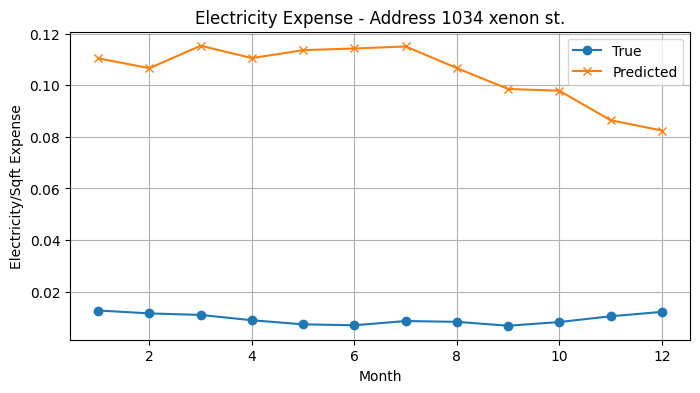

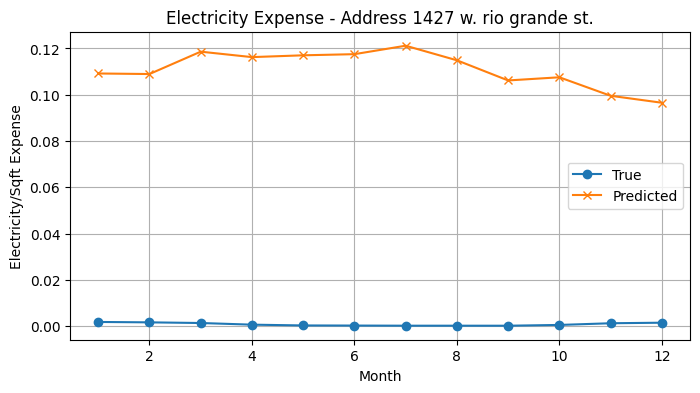

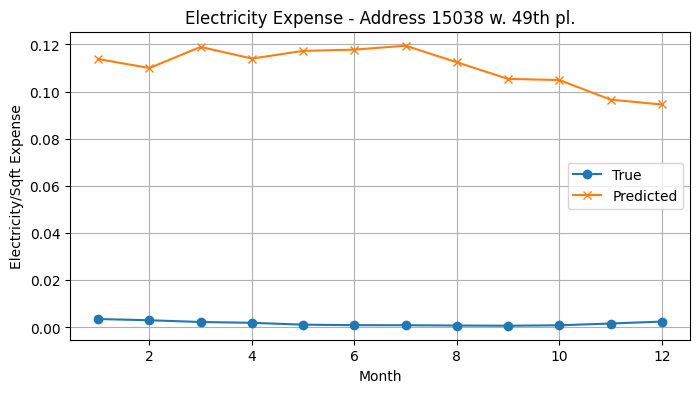

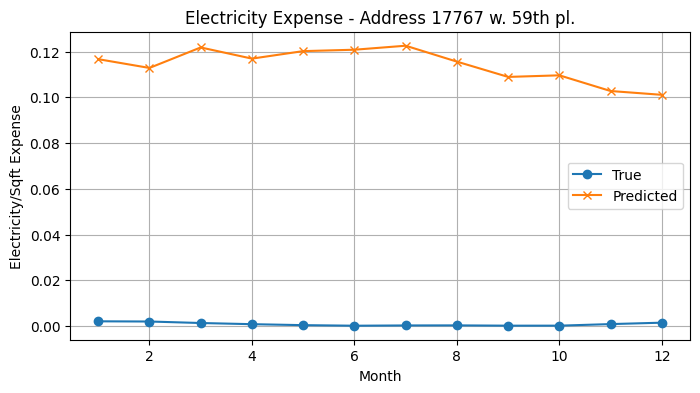

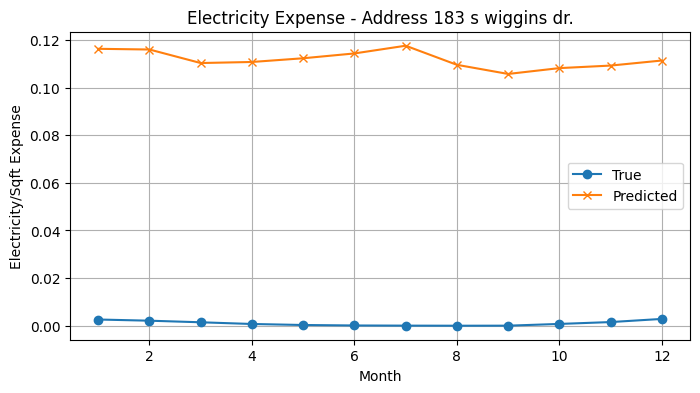

...

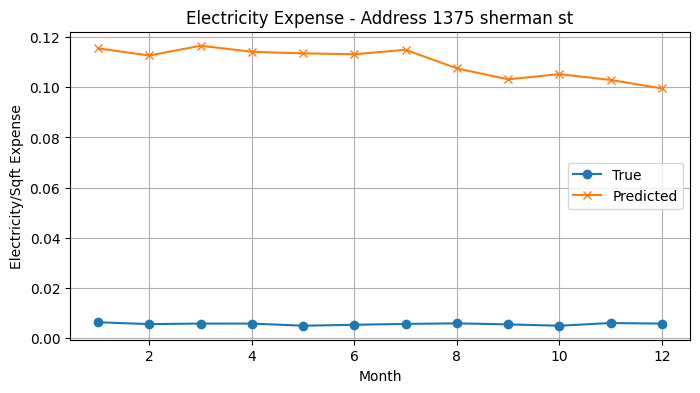

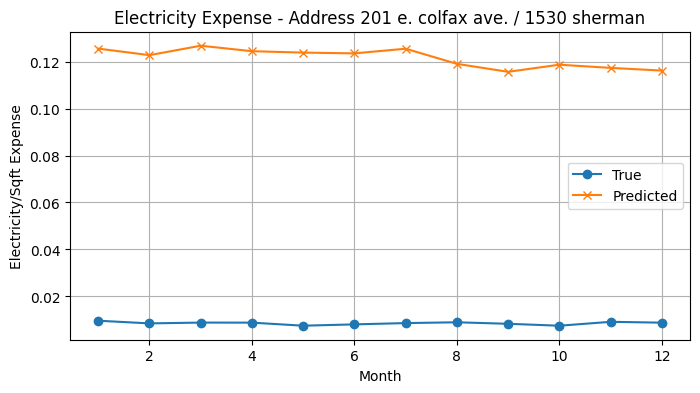

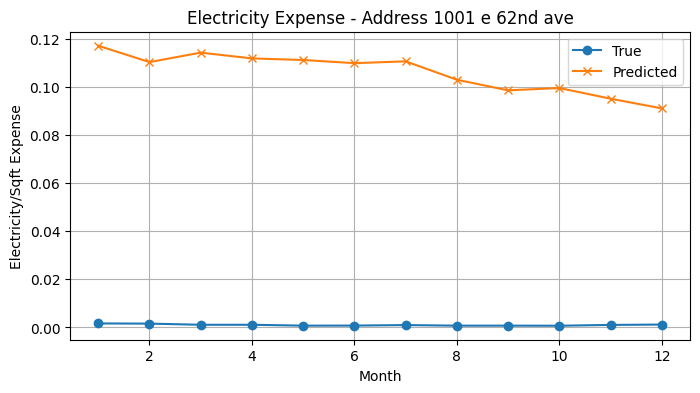

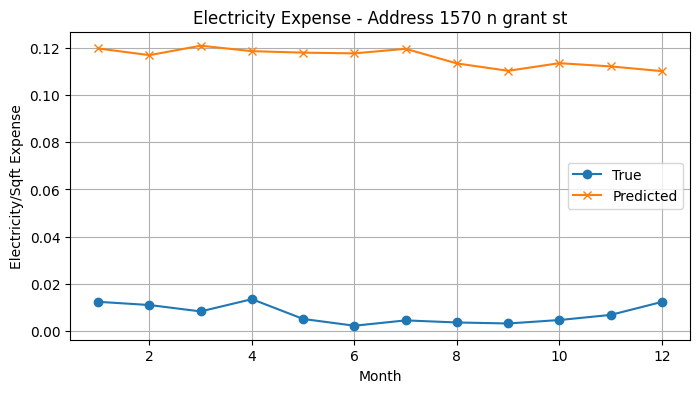

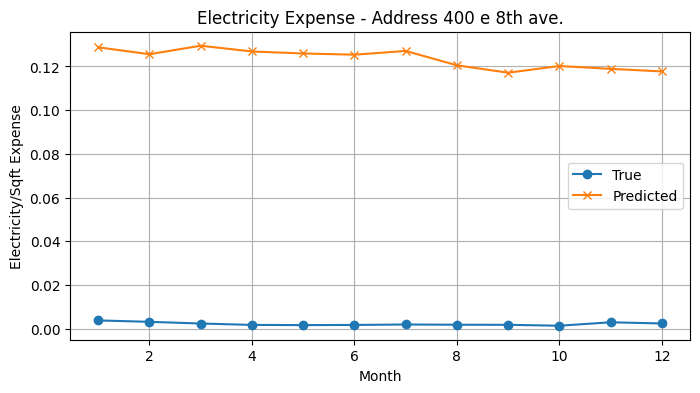

In [ ]:
# Plot true/predicted results for each building

# Get unique addresses
addresses = results["Address_enc"].unique()

for address in addresses:
    subset = results[results["Address_enc"] == address]

    plt.figure(figsize=(8, 4))
    plt.plot(subset["Month"], subset["True_Elec_expense_per_sqft"], label="True", marker='o')
    plt.plot(subset["Month"], subset["Pred_Elec_expense_per_sqft"], label="Predicted", marker='x')
    plt.title(f"Electricity Expense - Address {le_add.classes_[address]}")
    plt.xlabel("Month")
    plt.ylabel("Electricity/Sqft Expense")
    plt.legend()
    plt.grid(True)
    plt.show()

**Takeaways Moving Forward**

One of the main flaws in this last implementation is using a label encoder to differentiate our buildings. At first, I thought the discrepancy between true and predicted values involved scaling, where one feature was being scaled in training but not testing, but this was not the case. Rather, it was the varying scales between some of our features, for example year is between 2015-2023, month is between 1-12, but average temp is between 0-1 and expense/sqft is between 0-0.1. This leads to difficulty in predicting values on a vastly different scale than the outputs. Moving forward, I look to address these scaling issues, as well as use one-hot encoding to treat each building as it's own category as opposed to implying some sort of ordinal relationship between buildings.

### Finetuning Neural Network

In [ ]:
# One-hot encode address, cyclical encode Month, standard scale year, scale target variable by fixed factor

nn_df = pd.get_dummies(nn_df, columns=['Address_enc'], prefix='Address_enc')

nn_df['Month_sin'] = np.sin(2 * np.pi * nn_df['Month'] / 12)
nn_df['Month_cos'] = np.cos(2 * np.pi * nn_df['Month'] / 12)

nn_df = nn_df.drop(columns=['Month'])

scaler = StandardScaler()

nn_df['Year'] = scaler.fit_transform(nn_df[['Year']])

nn_df['Elec_expense_per_sqft'] = nn_df['Elec_expense_per_sqft'] / (nn_df['Elec_expense_per_sqft'].max())

nn_df

,Avg_temp,Year,Elec_expense_per_sqft,Address_enc_0,Address_enc_1,Address_enc_2,Address_enc_3,Address_enc_4,Address_enc_5,Address_enc_6,...,Address_enc_38,Address_enc_39,Address_enc_40,Address_enc_41,Address_enc_42,Address_enc_43,Address_enc_44,Address_enc_45,Month_sin,Month_cos
0,0.734908,-1.720147,0.120112,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,-5.000000e-01,-8.660254e-01
1,0.728090,-1.720147,0.097890,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,-8.660254e-01,-5.000000e-01
2,0.652174,-1.720147,0.086466,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,-1.000000e+00,-1.836970e-16
3,0.608392,-1.720147,0.089115,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,-8.660254e-01,5.000000e-01
4,1.000000,-1.720147,0.106166,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,-5.000000e-01,8.660254e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4687,0.625000,1.529019,0.016409,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,-8.660254e-01,-5.000000e-01
4688,0.718750,1.529019,0.016069,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,-1.000000e+00,-1.836970e-16
4689,0.550000,1.529019,0.012440,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,-8.660254e-01,5.000000e-01
4690,0.561404,1.529019,0.026126,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,-5.000000e-01,8.660254e-01


In [ ]:
# Retrain

# Inverse transform the 'Year' column
nn_df['Year_unscaled'] = scaler.inverse_transform(nn_df[['Year']])

# Split the data
train_df = nn_df[nn_df['Year_unscaled'] != 2023]
test_df = nn_df[nn_df['Year_unscaled'] == 2023]

# Drop 'Year_unscaled'
nn_df.drop('Year_unscaled', axis=1, inplace=True)


# Get training and testing data

X_train = train_df.drop(['Elec_expense_per_sqft'], axis=1)
y_train = train_df['Elec_expense_per_sqft']

X_test = test_df.drop(['Elec_expense_per_sqft'], axis=1)
y_test = test_df['Elec_expense_per_sqft']

# Bigger model architecture
model = Sequential()
model.add(Dense(256, input_dim=X_train.shape[1], activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1))  # Regression output

model.compile(optimizer='adam', loss='mse', metrics=['mae'])

model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2)

Epoch 1/100


104/104 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 328.0043 - mae: 9.2177 - val_loss: 0.0329 - val_mae: 0.1296
Epoch 2/100
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0102 - mae: 0.0702 - val_loss: 0.0198 - val_mae: 0.0911
Epoch 3/100
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0080 - mae: 0.0644 - val_loss: 0.0174 - val_mae: 0.0903
Epoch 4/100
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0089 - mae: 0.0703 - val_loss: 0.0160 - val_mae: 0.0978
Epoch 5/100
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0119 - mae: 0.0850 - val_loss: 0.0807 - val_mae: 0.2549
Epoch 6/100
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0137 - mae: 0.0879 - val_loss: 0.0227 - val_mae: 0.0939
Epoch 7/100
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0757 - mae: 0.1489 - val_loss: 0.7440 - val_mae: 0.8535
Epoch 8/100
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.6386 - mae: 0.5904 - val_loss: 1.6681 - val_mae: 1.2856
Epoch 9/100
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - los

In [ ]:
# Evaluate

y_pred = model.predict(X_test)

# RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# R^2 Score
r2 = r2_score(y_test, y_pred)

print(f"RMSE: {rmse:.4f}")
print(f"R² Score: {r2:.4f}")

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
RMSE: 0.0909
R² Score: 0.1835


In [ ]:
# Combine results

results = pd.DataFrame({
    "True_Elec_expense_per_sqft (scaled)": y_test,
    "Pred_Elec_expense_per_sqft (scaled)": y_pred.flatten()
})

results

,True_Elec_expense_per_sqft (scaled),Pred_Elec_expense_per_sqft (scaled)
90,0.110822,0.172284
91,0.101030,0.171685
92,0.095848,0.163937
93,0.077915,0.157365
94,0.063991,0.148267
...,...,...
4687,0.016409,0.082007
4688,0.016069,0.087788
4689,0.012440,0.094416
4690,0.026126,0.102500


Despite better results, both with R^2 and RMSE, the difference in mae/loss and validation mae/validation loss is considerable. That said, while the predictions are still very bad, I proceed by adding dropout layers and regularizers to address the problem of overfitting from two different angles. Again, while the results are ideal, I would rather increase the epochs and layers, while adding tools to address the overfitting which is, and will become more of an issue if not added.

In [ ]:
# One more layer, added dropout/regularization, increased epochs

# Inverse transform the 'Year' column
nn_df['Year_unscaled'] = scaler.inverse_transform(nn_df[['Year']])

# Split the data
train_df = nn_df[nn_df['Year_unscaled'] != 2023]
test_df = nn_df[nn_df['Year_unscaled'] == 2023]

# Drop 'Year_unscaled'
nn_df.drop('Year_unscaled', axis=1, inplace=True)

# Get training and testing data

X_train = train_df.drop(['Elec_expense_per_sqft'], axis=1)
y_train = train_df['Elec_expense_per_sqft']

X_test = test_df.drop(['Elec_expense_per_sqft'], axis=1)
y_test = test_df['Elec_expense_per_sqft']

# Model architecture
model = Sequential()
model.add(Dense(512, input_dim=X_train.shape[1], activation='relu', kernel_regularizer=l2(1e-2)))
model.add(Dropout(0.1))

model.add(Dense(256, activation='relu', kernel_regularizer=l2(1e-2)))
model.add(Dropout(0.2))

model.add(Dense(128, activation='relu', kernel_regularizer=l2(1e-2)))
model.add(Dropout(0.3))

model.add(Dense(64, activation='relu', kernel_regularizer=l2(1e-2)))
model.add(Dropout(0.4))

model.add(Dense(32, activation='relu', kernel_regularizer=l2(1e-2)))
model.add(Dropout(0.5))

model.add(Dense(1))  # Output layer for regression

model.compile(optimizer='adam', loss='mse', metrics=['mae'])

model.fit(X_train, y_train, epochs=200, batch_size=32, validation_split=0.2)

Epoch 1/200
104/104 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - loss: 2487.3950 - mae: 27.7787 - val_loss: 4.4726 - val_mae: 0.3947
Epoch 2/200
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 30.3885 - mae: 3.5700 - val_loss: 4.2363 - val_mae: 0.1095
Epoch 3/200
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 5.8935 - mae: 0.5795 - val_loss: 4.1831 - val_mae: 0.1096
Epoch 4/200
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 4.1720 - mae: 0.0654 - val_loss: 4.1242 - val_mae: 0.1070
Epoch 5/200
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 4.2279 - mae: 0.0630 - val_loss: 4.0736 - val_mae: 0.1045
Epoch 6/200
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 4.0666 - mae: 0.0561 - val_loss: 4.0276 - val_mae: 0.1029
Epoch 7/200
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 4.0144 - mae: 0.0505 - val_loss: 3.9837 - val_mae: 0.1015
Epoch 8/200
104/104 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.9619 - mae: 0.0483 - val_loss: 3.9449 - val_mae: 0.1000
Epoch 9/200
104/104 ━━━━━━━━━━━━━━━━━━━━ 

In [ ]:
# Evaluate

y_pred = model.predict(X_test)

# RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# R^2 Score
r2 = r2_score(y_test, y_pred)

print(f"RMSE: {rmse:.4f}")
print(f"R² Score: {r2:.4f}")

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
RMSE: 0.1014
R² Score: -0.0165


In [ ]:
# Combine results

results = pd.DataFrame({
    "True_Elec_expense_per_sqft (scaled)": y_test,
    "Pred_Elec_expense_per_sqft (scaled)": y_pred.flatten()
})

results

,True_Elec_expense_per_sqft (scaled),Pred_Elec_expense_per_sqft (scaled)
90,0.110822,0.029496
91,0.101030,0.029496
92,0.095848,0.029496
93,0.077915,0.029496
94,0.063991,0.029496
...,...,...
4687,0.016409,0.029496
4688,0.016069,0.029496
4689,0.012440,0.029496
4690,0.026126,0.029496


Two issues here: overfitting and underfitting simultaneously. We can notice the overfitting in the lack of generalizability to our validation data in our epochs above. Also, despite the complexity of the model, it is not capturing underlying patterns in the data, and has favored a fixed guess. While the models above have plenty of room for improvement, this comes down to the how traditional Neural Networks aren't well suited for data with long-term dependencies, or more explicitly aren't well suited for time series data. Thus, I shifted my approach to Recurrent Neural Networks (RNNs) with LSTM (Long Short Term Memory) as a means to capture both seasonality and allowing past data to be an indicator of future data.

### Recurrent Neural Network (RNN)

In [ ]:
# Create new df for RNN

columns = ['Address', 'Date', 'Avg_temp', 'Elec_expense_per_sqft']

non_date_columns = [
    'Address',
    'Lot Size (Final SqFt)',
    'Average Cost/SqFt',
    'Cost Growth Rate (slope)',
    'R² Score'
]

data_rows = []

# Normalize city names once
normalized_weather_data['City'] = normalized_weather_data['City'].str.lower()

# Configure data for CDHS
for _, row in normalized_cdhs_with_lot_size.iterrows():
    address = row['Address']
    sqft = row['Lot Size (Final SqFt)']

    # Match city
    address_lower = address.lower()
    matching_rows = property_info_df[property_info_df.index.str.lower() == address_lower]
    if matching_rows.empty:
        continue

    city = matching_rows.iloc[0]['City'].lower()

    # Find matching city in weather_df
    city_weather_row = normalized_weather_data[normalized_weather_data['City'] == city]
    if city_weather_row.empty:
        continue

    # Drop non-date columns (keep just the weather values)
    city_weather = city_weather_row.drop(columns=['City']).iloc[0]

    for col, value in row.items():
        if col not in non_date_columns:
            avg_temp = city_weather.get(col, None)  # match by month name like "July 2015"
            data_rows.append({
                'Address': address,
                'Date': col,
                'Avg_temp': avg_temp,
                'Elec_expense_per_sqft': value
            })

# Configure data for DPA
for _, row in normalized_dpa_with_lot_size.iterrows():
    address = row['Address']
    sqft = row['Lot Size (Final SqFt)']

    # Match city
    address_lower = address.lower()
    matching_rows = property_info_df[property_info_df.index.str.lower() == address_lower]
    if matching_rows.empty:
        continue

    city = matching_rows.iloc[0]['City'].lower()

    # Find matching city in weather_df
    city_weather_row = normalized_weather_data[normalized_weather_data['City'] == city]
    if city_weather_row.empty:
        continue

    # Drop non-date columns (keep just the weather values)
    city_weather = city_weather_row.drop(columns=['City']).iloc[0]

    for col, value in row.items():
        if col not in non_date_columns:
            avg_temp = city_weather.get(col, None)  # Match by month name
            data_rows.append({
                'Address': address,
                'Date': col,
                'Avg_temp': avg_temp,
                'Elec_expense_per_sqft': value
            })


rnn_df = pd.DataFrame(data_rows, columns=columns)

rnn_df

,Address,Date,Avg_temp,Elec_expense_per_sqft
0,1034 xenon st.,2015-07-01,0.734908,0.013769
1,1034 xenon st.,2015-08-01,0.728090,0.011222
2,1034 xenon st.,2015-09-01,0.652174,0.009912
3,1034 xenon st.,2015-10-01,0.608392,0.010216
4,1034 xenon st.,2015-11-01,1.000000,0.012170
...,...,...,...,...
4687,400 e 8th ave.,2023-08-01,0.625000,0.001881
4688,400 e 8th ave.,2023-09-01,0.718750,0.001842
4689,400 e 8th ave.,2023-10-01,0.550000,0.001426
4690,400 e 8th ave.,2023-11-01,0.561404,0.002995


In [ ]:
# Create month year

rnn_df['Month'] = rnn_df['Date'].dt.month
rnn_df['Year'] = rnn_df['Date'].dt.year

rnn_df = rnn_df.drop(columns=['Date'])

rnn_df

,Address,Avg_temp,Elec_expense_per_sqft,Month,Year
0,1034 xenon st.,0.734908,0.013769,7,2015
1,1034 xenon st.,0.728090,0.011222,8,2015
2,1034 xenon st.,0.652174,0.009912,9,2015
3,1034 xenon st.,0.608392,0.010216,10,2015
4,1034 xenon st.,1.000000,0.012170,11,2015
...,...,...,...,...,...
4687,400 e 8th ave.,0.625000,0.001881,8,2023
4688,400 e 8th ave.,0.718750,0.001842,9,2023
4689,400 e 8th ave.,0.550000,0.001426,10,2023
4690,400 e 8th ave.,0.561404,0.002995,11,2023


In [ ]:
def create_training_windows(df, building_col, time_cols, feature_cols, target_col, window_size=12, forecast_horizon=12):
    X, y = [], []
    df = df.sort_values(by=[building_col] + time_cols)

    for _, group in df.groupby(building_col):
        group = group[group['Year'] < 2023].reset_index(drop=True)

        for i in range(len(group) - window_size - forecast_horizon + 1):
            X_window = group.loc[i:i + window_size - 1, feature_cols].values
            y_window = group.loc[i + window_size: i + window_size + forecast_horizon - 1, target_col].values

            if len(y_window) == forecast_horizon:
                X.append(X_window)
                y.append(y_window)

    return np.array(X), np.array(y)


def create_testing_sequence(df, building_col, time_cols, feature_cols, target_col):
    X, y = [], []
    df = df.sort_values(by=[building_col] + time_cols)

    for _, group in df.groupby(building_col):
        # Extract 2022 and 2023 data
        group_2022 = group[group['Year'] == 2022].reset_index(drop=True)
        group_2023 = group[group['Year'] == 2023].reset_index(drop=True)

        # Ensure both 2022 and 2023 have exactly 12 months of data
        if len(group_2022) == 12 and len(group_2023) == 12:
            # X_test is 2022 data
            X_seq = group_2022[feature_cols].values

            # y_test is 2023 data
            y_seq = group_2023[target_col].values

            X.append(X_seq)
            y.append(y_seq)

    return np.array(X), np.array(y)

In [ ]:
# Create windows for the train set (2015-2022)
X_train, y_train = create_training_windows(rnn_df, building_col='Address', time_cols=['Month', 'Year'],
                                           feature_cols=['Avg_temp', 'Elec_expense_per_sqft'], target_col='Elec_expense_per_sqft')

# Create windows for the test set (2023, we use 2023 to forecast it)
X_test, y_test = create_testing_sequence(rnn_df, building_col='Address', time_cols=['Month', 'Year'],
                                         feature_cols=['Avg_temp', 'Elec_expense_per_sqft'], target_col='Elec_expense_per_sqft')

In [ ]:
# Ensure same shape (# windows * # buildings, window size, features)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)


(3082, 12, 2)
(3082, 12)
(46, 12, 2)
(46, 12)


In [ ]:
# Initialize model

input_shape = X_train.shape[1:]  # (12, num_features)

model = models.Sequential([
    layers.Input(shape=input_shape),
    layers.LSTM(64, return_sequences=False),
    layers.Dense(12)  # Predict next 12 months
])

model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 64)             │        17,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 12)             │           780 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,932 (70.05 KB)

 Trainable params: 17,932 (70.05 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(X_train, y_train, epochs=50, batch_size=16, validation_split=0.1)

Epoch 1/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - loss: 6.4941e-04 - val_loss: 8.3060e-06
Epoch 2/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 4.3943e-05 - val_loss: 5.9609e-06
Epoch 3/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 2.1337e-05 - val_loss: 3.1972e-06
Epoch 4/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.8180e-05 - val_loss: 1.9926e-06
Epoch 5/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 1.6613e-05 - val_loss: 3.0724e-06
Epoch 6/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.7253e-05 - val_loss: 1.5459e-06
Epoch 7/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 1.4383e-05 - val_loss: 5.8701e-06
Epoch 8/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 1.4240e-05 - val_loss: 1.4374e-06
Epoch 9/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.6153e-05 - val_loss: 2.0604e-06
Epoch 10/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.4357e-05 - val_loss: 1.9340e-06
Epoch 11/50
174/174 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - los

In [ ]:
# Predict

y_pred = model.predict(X_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 398ms/step


In [ ]:
# Flatten test and predicted values and evluate performance

y_test_flat = y_test.flatten()
y_pred_flat = y_pred.flatten()

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test_flat, y_pred_flat)
print(f"Mean Absolute Error: {mae:.4f}")

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test_flat, y_pred_flat)
print(f"Mean Squared Error: {mse:.4f}")

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f"Root Mean Squared Error: {rmse:.4f}")

# Calculate R-Squared (R²)
r2 = r2_score(y_test_flat, y_pred_flat)
print(f"R-Squared: {r2:.4f}")

Mean Absolute Error: 0.0030
Mean Squared Error: 0.0001
Root Mean Squared Error: 0.0089
R-Squared: 0.4057


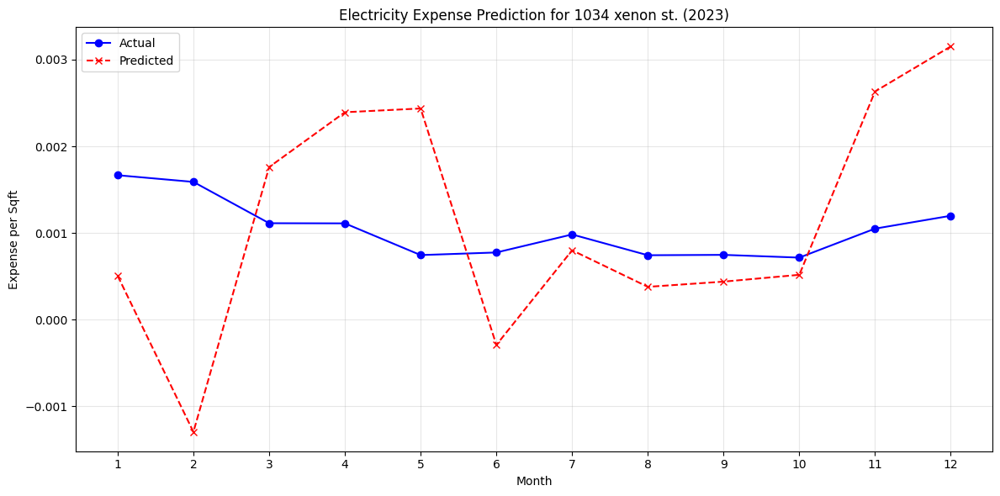

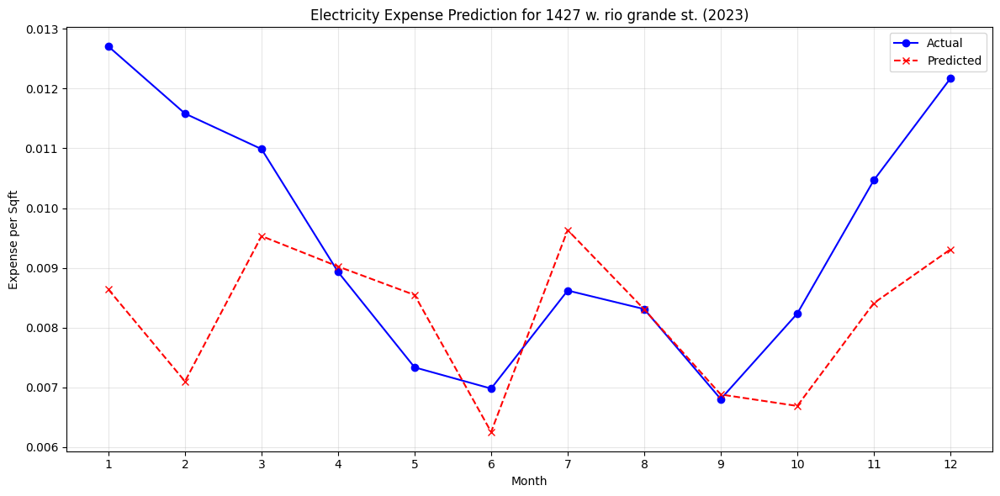

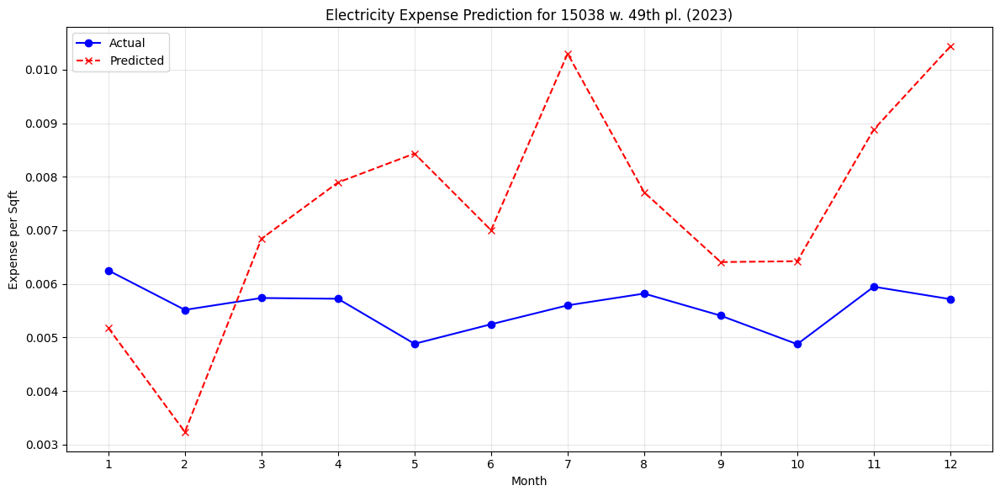

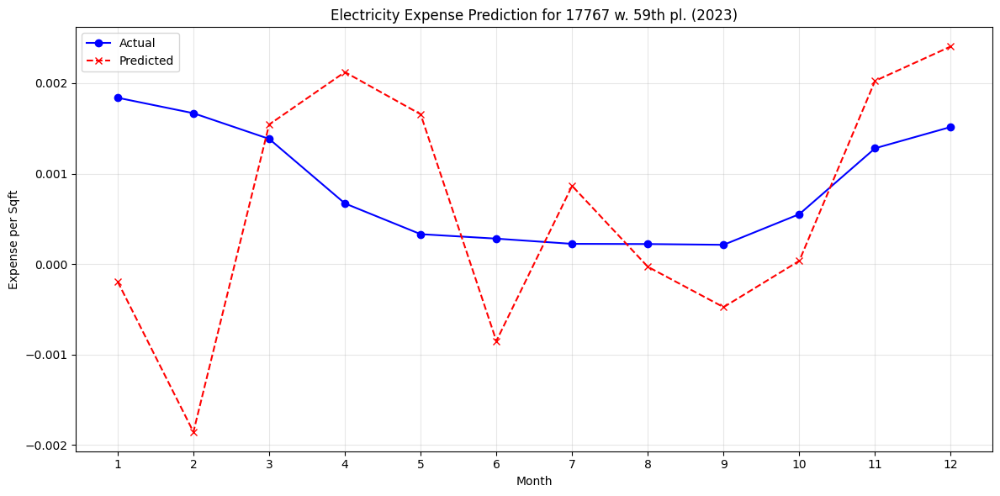

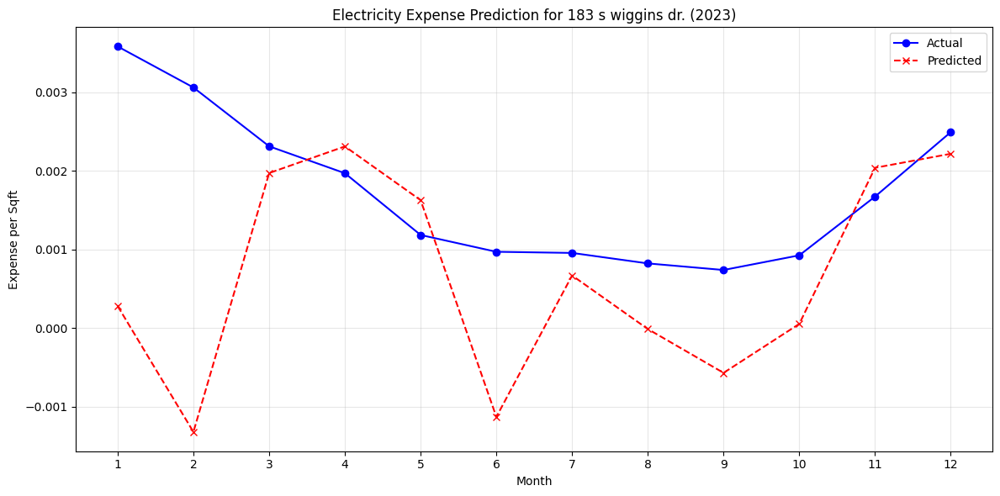

...

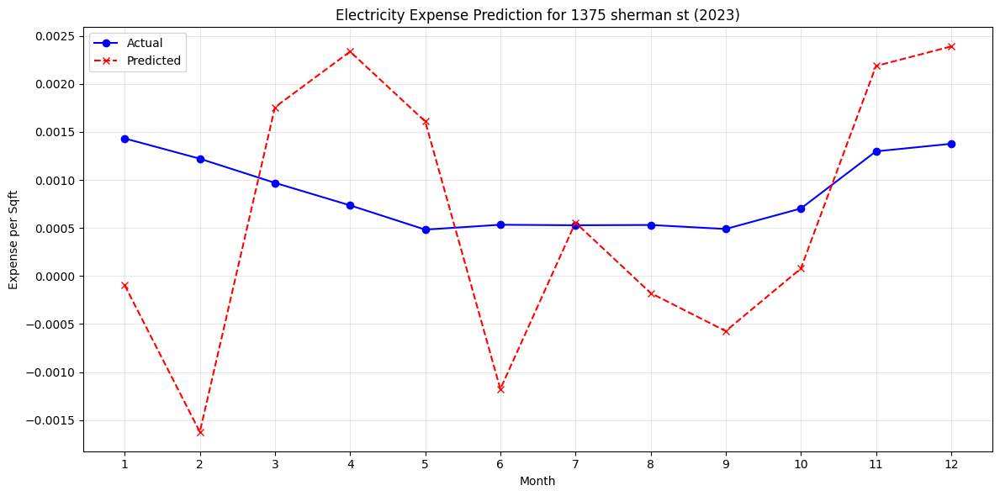

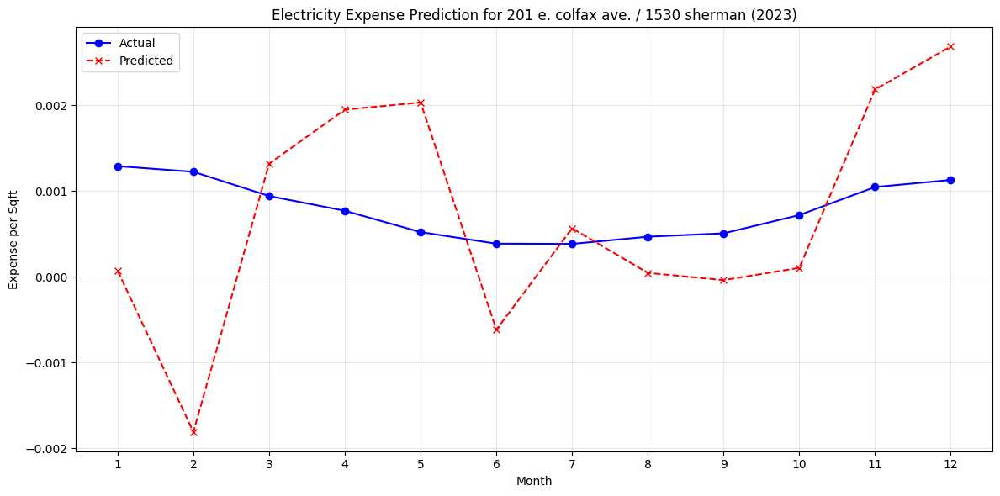

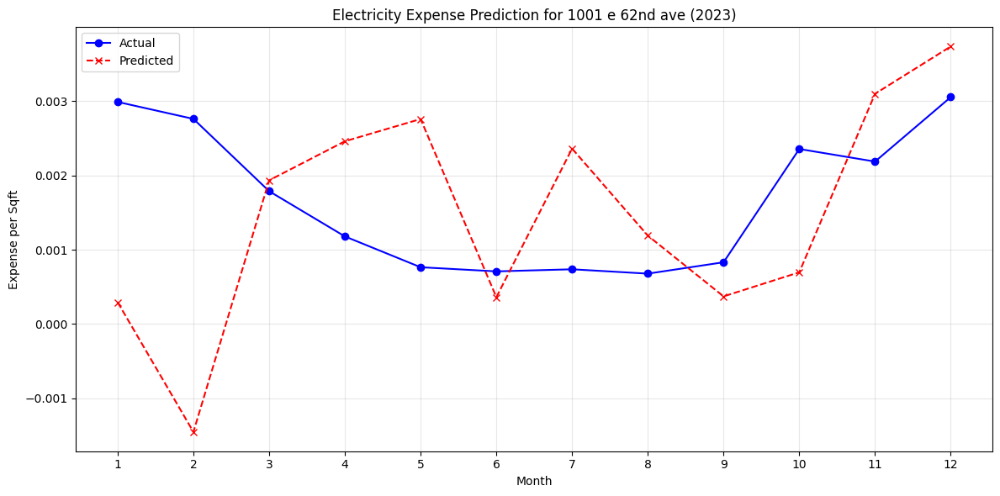

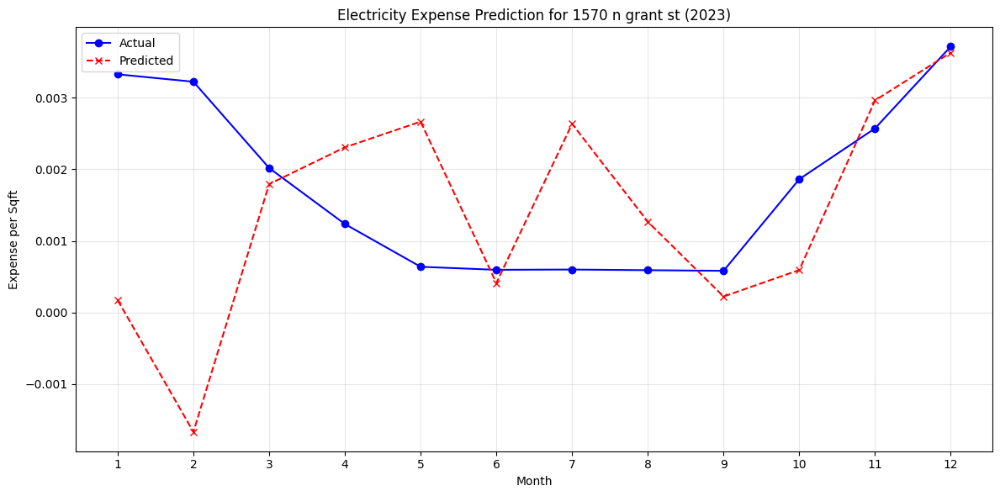

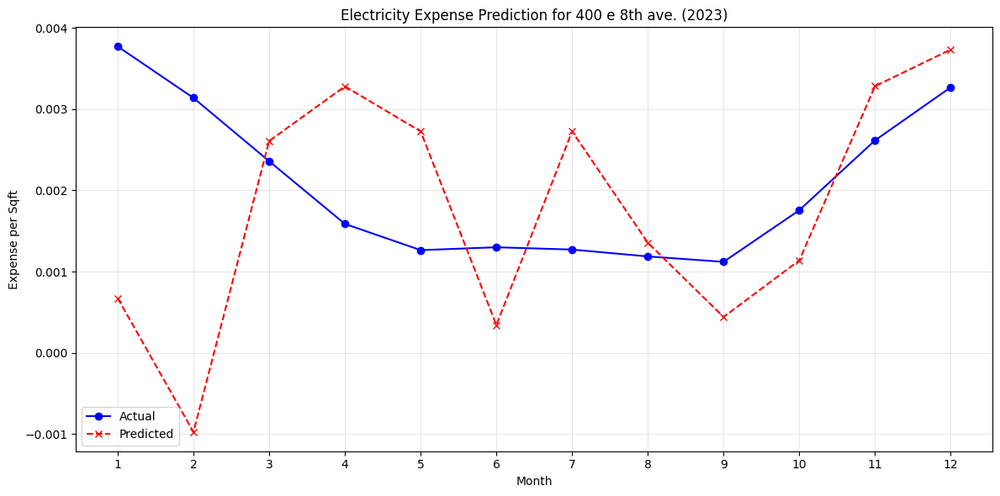

In [ ]:
def plot_predictions(df, y_test, y_pred, building_col):
    # Flatten predictions and targets
    y_test_flat = y_test.reshape(-1, 12)
    y_pred_flat = y_pred.reshape(-1, 12)

    # Extract unique buildings in the testing set
    buildings = df[df['Year'] == 2023][building_col].unique()

    # Ensure we have the same number of buildings in y_test and y_pred
    assert len(buildings) == len(y_test_flat) == len(y_pred_flat), \
        "Mismatch between number of buildings and test/pred arrays"

    for i, building in enumerate(buildings):
        # Extract the sequences for this building
        actual = y_test_flat[i]
        predicted = y_pred_flat[i]

        plt.figure(figsize=(12, 6))
        plt.plot(range(1, 13), actual, marker='o', label='Actual', linestyle='-', color='blue')
        plt.plot(range(1, 13), predicted, marker='x', label='Predicted', linestyle='--', color='red')
        plt.title(f"Electricity Expense Prediction for {building} (2023)")
        plt.xlabel("Month")
        plt.ylabel("Expense per Sqft")
        plt.xticks(range(1, 13))
        plt.grid(alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

# Example Usage
plot_predictions(rnn_df, y_test, y_pred, building_col='Address')

With an R^2 of ~0.40 and RMSE < 0.01, the results are certainly much better than observed from the traditional Neural Network. That said, looking into the plots it's easy to see there are certain buildings which are forecasted much better. There are still certainly flaws in the current implementation. Currently, we are feeding the model the 12 previous months and asking it to predict the next 12 months, but for our testing data we simply want to predict the year 2023 from January-December. This discrepancy in the starting months our model is forecasting is no doubt causing issues. We don't have any sort of seasonal component we are feeding the model, so my thought is there are two ways of approaching this: either feed in a cyclically encoded month component, or start each training sequence on the same month (namely January). So, from here I shift my sequences to all start in January despite limiting the amount of training data - for simplicity. I also split the training of each building up so we can more effectively see which buildings are best/worst modeled.

In [ ]:
# Display working df

rnn_df

,Address,Avg_temp,Elec_expense_per_sqft,Month,Year
0,1034 xenon st.,0.734908,0.013769,7,2015
1,1034 xenon st.,0.728090,0.011222,8,2015
2,1034 xenon st.,0.652174,0.009912,9,2015
3,1034 xenon st.,0.608392,0.010216,10,2015
4,1034 xenon st.,1.000000,0.012170,11,2015
...,...,...,...,...,...
4687,400 e 8th ave.,0.625000,0.001881,8,2023
4688,400 e 8th ave.,0.718750,0.001842,9,2023
4689,400 e 8th ave.,0.550000,0.001426,10,2023
4690,400 e 8th ave.,0.561404,0.002995,11,2023


In [ ]:
# Functions for sequences of data (starting in January months only)

# Create training windows starting only in January
def create_training_windows(df, building_col, time_cols, feature_cols, target_col, window_size=12, forecast_horizon=12):
    X, y = [], []
    df = df.sort_values(by=[building_col] + time_cols)

    for _, group in df.groupby(building_col):
        group = group[group['Year'] < 2023].reset_index(drop=True)

        for i in range(len(group) - window_size - forecast_horizon + 1):
            if group.loc[i, 'Month'] != 1:  # Only start in January
                continue

            X_window = group.loc[i:i + window_size - 1, feature_cols].values
            y_window = group.loc[i + window_size: i + window_size + forecast_horizon - 1, target_col].values

            if len(y_window) == forecast_horizon:
                X.append(X_window)
                y.append(y_window)

    return np.array(X), np.array(y)

# Create testing sequence for 2022 (input) -> predict 2023
def create_testing_sequence(df, building_col, time_cols, feature_cols, target_col):
    X, y = [], []
    df = df.sort_values(by=[building_col] + time_cols)

    for _, group in df.groupby(building_col):
        group_2022 = group[group['Year'] == 2022].reset_index(drop=True)
        group_2023 = group[group['Year'] == 2023].reset_index(drop=True)

        if len(group_2022) == 12 and len(group_2023) == 12:
            X_seq = group_2022[feature_cols].values
            y_seq = group_2023[target_col].values
            X.append(X_seq)
            y.append(y_seq)

    return np.array(X), np.array(y)



In [ ]:
# Get training/testing

# Create windows for the train set (2015-2022)
X_train, y_train = create_training_windows(rnn_df, building_col='Address', time_cols=['Month', 'Year'],
                                           feature_cols=['Avg_temp', 'Elec_expense_per_sqft'], target_col='Elec_expense_per_sqft')

# Create windows for the test set (2023, we use 2023 to forecast it)
X_test, y_test = create_testing_sequence(rnn_df, building_col='Address', time_cols=['Month', 'Year'],
                                         feature_cols=['Avg_temp', 'Elec_expense_per_sqft'], target_col='Elec_expense_per_sqft')

In [ ]:
# Initialize model

input_shape = X_train.shape[1:]  # (12, num_features)

model = models.Sequential([
    layers.Input(shape=input_shape),
    layers.LSTM(64, return_sequences=False),
    layers.Dense(12)  # Predict next 12 months
])

model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_1 (LSTM)                   │ (None, 64)             │        17,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 12)             │           780 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,932 (70.05 KB)

 Trainable params: 17,932 (70.05 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(X_train, y_train, epochs=50, batch_size=16, validation_split=0.2)

Epoch 1/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 7.6211e-04 - val_loss: 8.6715e-05
Epoch 2/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 1.8788e-04 - val_loss: 6.5773e-05
Epoch 3/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 1.4033e-04 - val_loss: 1.6264e-05
Epoch 4/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1.0750e-04 - val_loss: 3.5030e-05
Epoch 5/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 9.2950e-05 - val_loss: 2.0003e-05
Epoch 6/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 1.0491e-04 - val_loss: 9.5025e-06
Epoch 7/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 9.0289e-05 - val_loss: 9.6379e-06
Epoch 8/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 6.1448e-05 - val_loss: 1.5899e-05
Epoch 9/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 5.5385e-05 - val_loss: 5.5667e-06
Epoch 10/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 3.3963e-05 - val_loss: 4.6125e-06
Epoch 11/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 1.6155e-0

In [ ]:
# Predict

y_pred = model.predict(X_test)

1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


In [ ]:
# Flatten test and predicted values and evluate performance

y_test_flat = y_test.flatten()
y_pred_flat = y_pred.flatten()

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test_flat, y_pred_flat)
print(f"Mean Absolute Error: {mae:.4f}")

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test_flat, y_pred_flat)
print(f"Mean Squared Error: {mse:.4f}")

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f"Root Mean Squared Error: {rmse:.4f}")

# Calculate R-Squared (R²)
r2 = r2_score(y_test_flat, y_pred_flat)
print(f"R-Squared: {r2:.4f}")

Mean Absolute Error: 0.0025
Mean Squared Error: 0.0000
Root Mean Squared Error: 0.0066
R-Squared: 0.6673


In [ ]:
# Plot predictions with corresponding R^2

def plot_predictions(df, y_test, y_pred, building_col):
    y_test_flat = y_test.reshape(-1, 12)
    y_pred_flat = y_pred.reshape(-1, 12)

    buildings = df[df['Year'] == 2023][building_col].unique()

    assert len(buildings) == len(y_test_flat) == len(y_pred_flat), \
        "Mismatch between buildings and predictions."

    r2_scores = {}

    for i, building in enumerate(buildings):
        actual = y_test_flat[i]
        predicted = y_pred_flat[i]
        r2 = r2_score(actual, predicted)
        r2_scores[building] = r2

        plt.figure(figsize=(12, 6))
        plt.plot(range(1, 13), actual, marker='o', label='Actual', color='blue')
        plt.plot(range(1, 13), predicted, marker='x', label='Predicted', color='red', linestyle='--')
        plt.title(f"{building} – 2023 Electricity Prediction\nR²: {r2:.4f}")
        plt.xlabel("Month")
        plt.ylabel("Expense per Sqft")
        plt.xticks(range(1, 13))
        plt.grid(alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

    return r2_scores


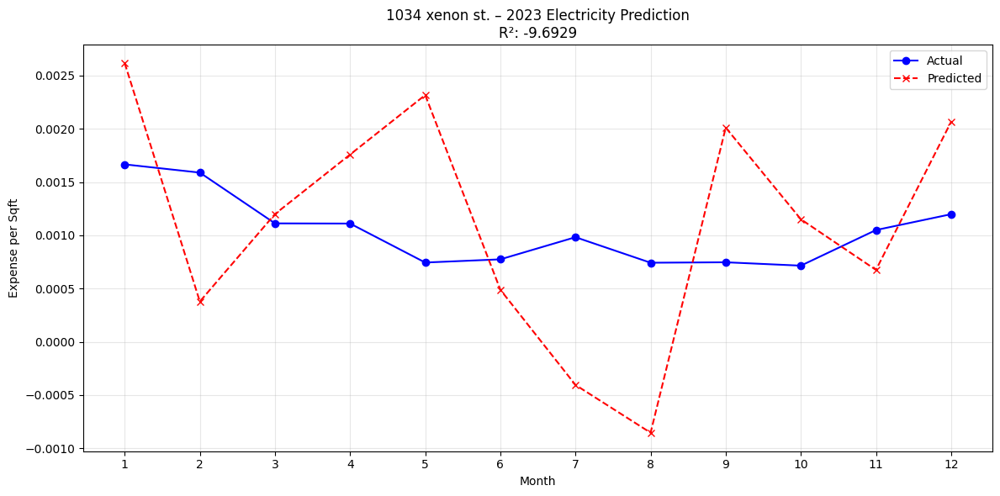

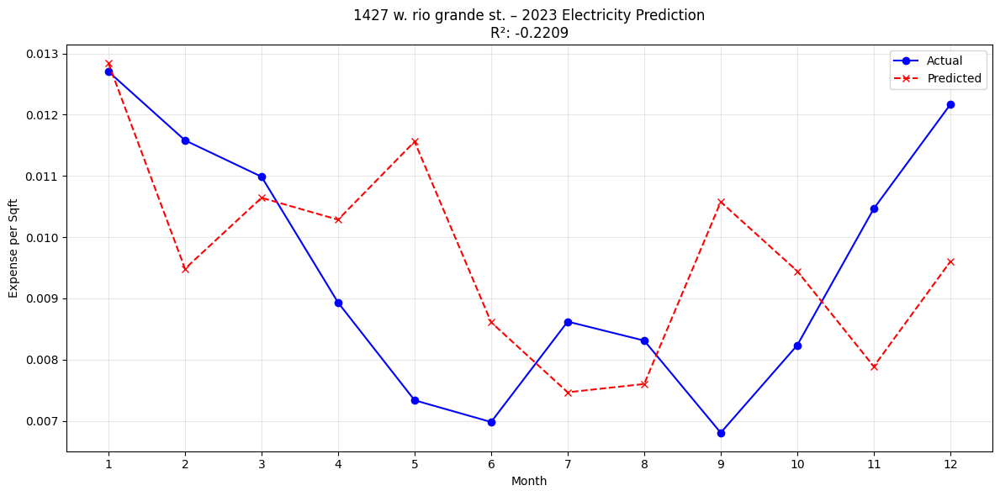

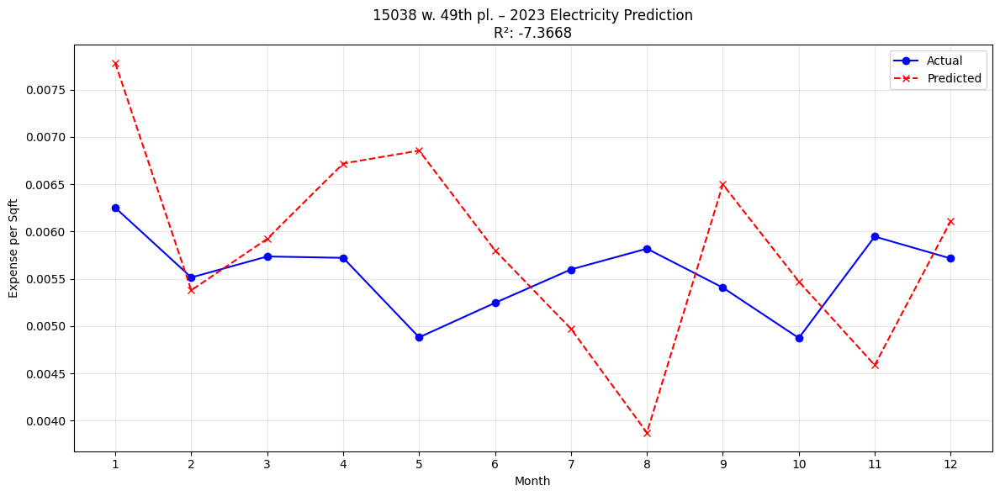

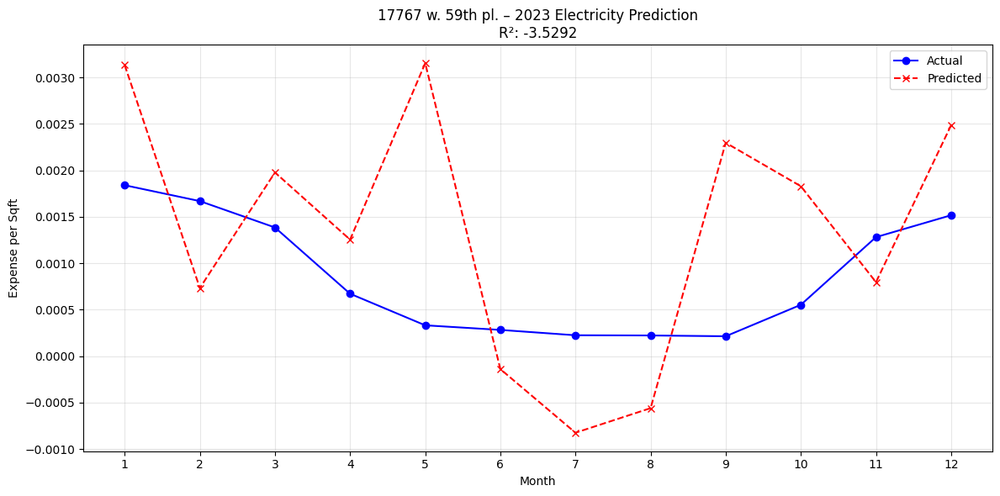

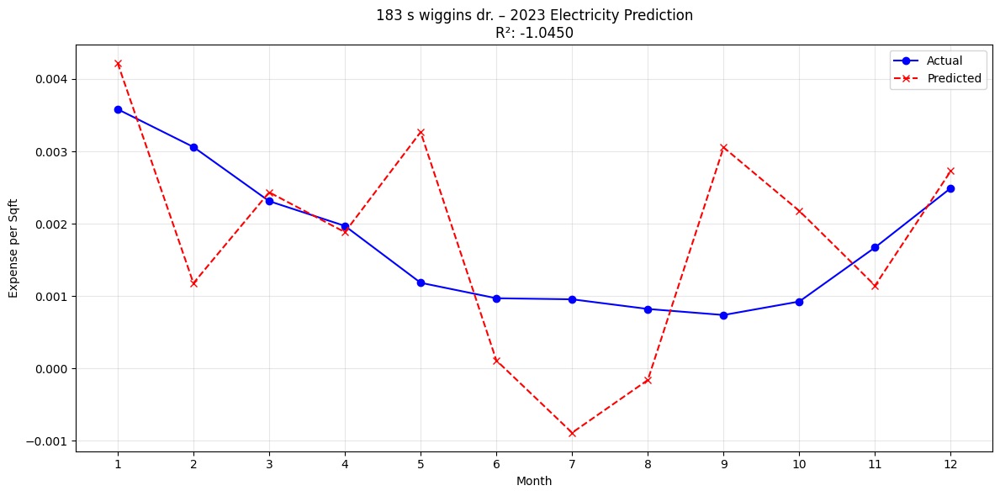

...

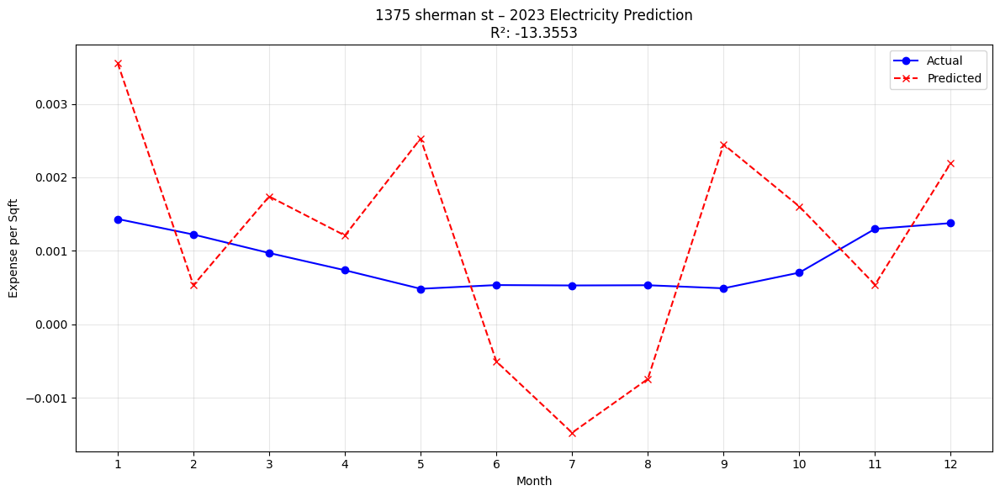

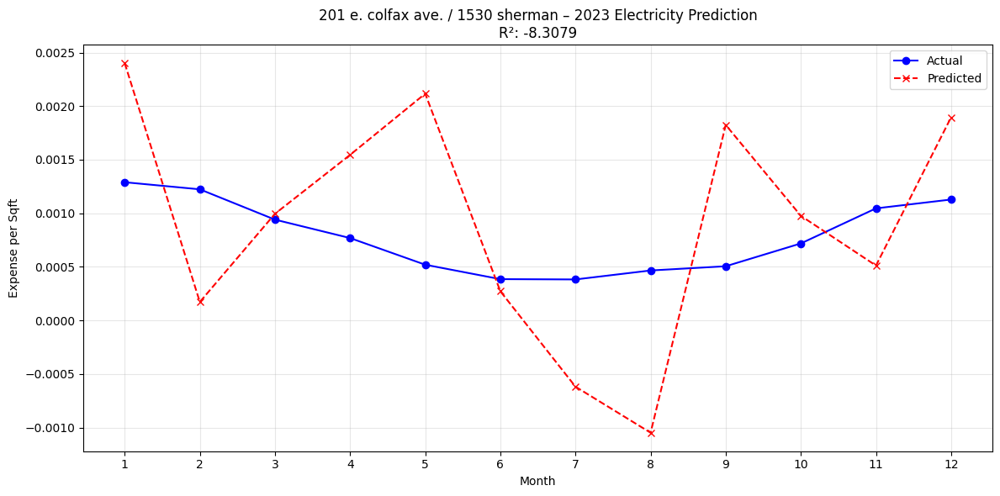

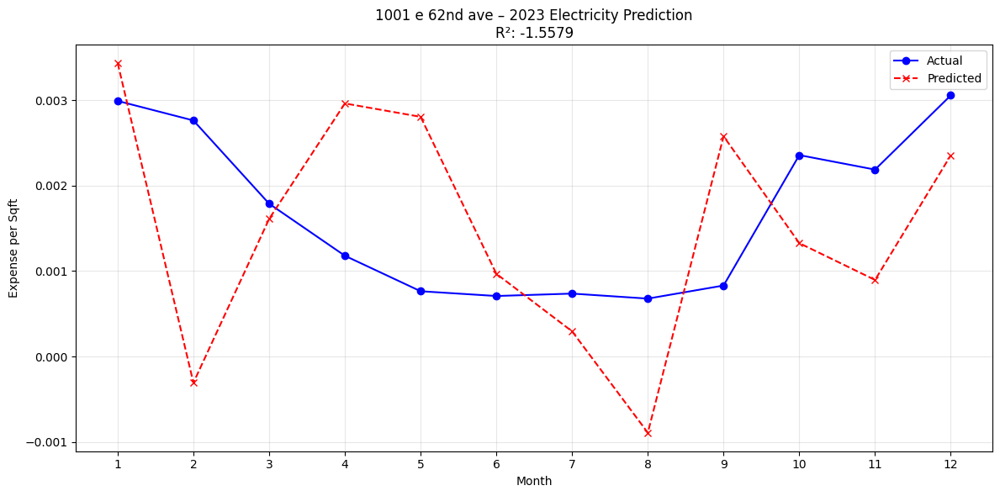

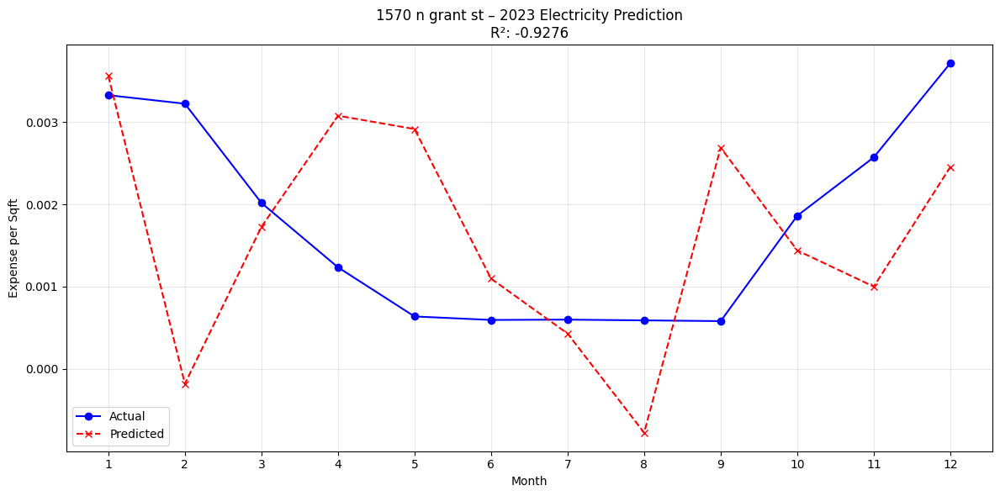

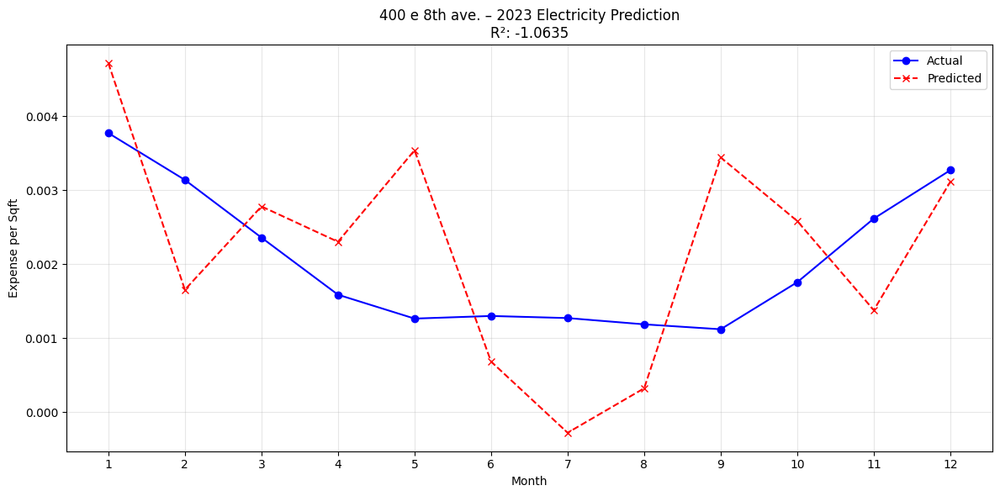

In [ ]:
r2_scores = plot_predictions(rnn_df, y_test, y_pred, building_col='Address')

In [ ]:
# Sort buildings on R^2

sorted_r2 = sorted(r2_scores.items(), key=lambda x: x[1], reverse=True)

print("Top 5 Buildings:")
for b, score in sorted_r2[:5]:
    print(f"{b}: R² = {score:.4f}")

print("Bottom 5 Buildings:")
for b, score in sorted_r2[-5:]:
    print(f"{b}: R² = {score:.4f}")

# Optionally group
high = [b for b, r2 in r2_scores.items() if r2 > 0.8]
mid = [b for b, r2 in r2_scores.items() if 0.5 <= r2 <= 0.8]
low = [b for b, r2 in r2_scores.items() if r2 < 0.5]

print(f"High R² (> 0.8): {len(high)} buildings")
print(f"Medium R² (0.5–0.8): {len(mid)} buildings")
print(f"Low R² (< 0.5): {len(low)} buildings")


Top 5 Buildings:
360 28 road: R² = 0.1012
1933 e. bridge st.: R² = 0.0374
1525 sherman st.: R² = -0.1172
3520 w. oxford ave., 3525 w. oxford ave, 3526 w. oxford ave., 3550 w. oxford ave., 4100 w.  oxford ave., 4106 s. knox court, 4106 s. knox ct., 4110 s. julian way, 4111 s. julian way, 4111 s. julian way, 4112 s. knox ct., 4116 s. knox ct., 4120 s. julian way, 4120 s. julian way, 4121 s. julian way, 4121 s. julian way, 4126 s. knox court, 4126 s. knox ct., 4130 s. julian way, 4131 s. julian way, 4132 s. julian way, 4136 s. knox ct., 4137 s. knox court, 4140 w. oxford ave, 4141 s. julian way, 4150 w. oxford ave., 4177 s. knox court, 4255 s. knox ct., 4300 s. knox court, 4388 w. oxford ave., 4390 w. oxford ave., 4395 w. oxford ave.: R² = -0.1247
1427 w. rio grande st.: R² = -0.2209
Bottom 5 Buildings:
510 s. nelson st.: R² = -15.4341
6225 simms st.: R² = -19.3534
272 w. harmony dr.: R² = -32.2613
330 e. hahns peak ave.: R² = -51.5864
571 eastbrook street: R² = -69.8862
High R² (> 0.8): 

## Computational Space

In [ ]:
nn_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4692 entries, 0 to 4691
Data columns (total 51 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Avg_temp               4692 non-null   float64
 1   Year                   4692 non-null   float64
 2   Elec_expense_per_sqft  4692 non-null   float64
 3   Address_enc_0          4692 non-null   bool   
 4   Address_enc_1          4692 non-null   bool   
 5   Address_enc_2          4692 non-null   bool   
 6   Address_enc_3          4692 non-null   bool   
 7   Address_enc_4          4692 non-null   bool   
 8   Address_enc_5          4692 non-null   bool   
 9   Address_enc_6          4692 non-null   bool   
 10  Address_enc_7          4692 non-null   bool   
 11  Address_enc_8          4692 non-null   bool   
 12  Address_enc_9          4692 non-null   bool   
 13  Address_enc_10         4692 non-null   bool   
 14  Address_enc_11         4692 non-null   bool   
 15  Addr

In [ ]:
rnn_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4692 entries, 0 to 4691
Data columns (total 5 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Address                4692 non-null   object 
 1   Avg_temp               4692 non-null   float64
 2   Elec_expense_per_sqft  4692 non-null   float64
 3   Month                  4692 non-null   int32  
 4   Year                   4692 non-null   int32  
dtypes: float64(2), int32(2), object(1)
memory usage: 578.3 KB


In [ ]:
train_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Index: 4140 entries, 0 to 4679
Data columns (total 52 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Avg_temp               4140 non-null   float64
 1   Year                   4140 non-null   float64
 2   Elec_expense_per_sqft  4140 non-null   float64
 3   Address_enc_0          4140 non-null   bool   
 4   Address_enc_1          4140 non-null   bool   
 5   Address_enc_2          4140 non-null   bool   
 6   Address_enc_3          4140 non-null   bool   
 7   Address_enc_4          4140 non-null   bool   
 8   Address_enc_5          4140 non-null   bool   
 9   Address_enc_6          4140 non-null   bool   
 10  Address_enc_7          4140 non-null   bool   
 11  Address_enc_8          4140 non-null   bool   
 12  Address_enc_9          4140 non-null   bool   
 13  Address_enc_10         4140 non-null   bool   
 14  Address_enc_11         4140 non-null   bool   
 15  Address_e

In [ ]:
test_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Index: 552 entries, 90 to 4691
Data columns (total 52 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Avg_temp               552 non-null    float64
 1   Year                   552 non-null    float64
 2   Elec_expense_per_sqft  552 non-null    float64
 3   Address_enc_0          552 non-null    bool   
 4   Address_enc_1          552 non-null    bool   
 5   Address_enc_2          552 non-null    bool   
 6   Address_enc_3          552 non-null    bool   
 7   Address_enc_4          552 non-null    bool   
 8   Address_enc_5          552 non-null    bool   
 9   Address_enc_6          552 non-null    bool   
 10  Address_enc_7          552 non-null    bool   
 11  Address_enc_8          552 non-null    bool   
 12  Address_enc_9          552 non-null    bool   
 13  Address_enc_10         552 non-null    bool   
 14  Address_enc_11         552 non-null    bool   
 15  Address_e

# 7. Conclusion

**Personal Takeaway**

Throughout the course of this project I have learned a lot more about working with real world data, which oftentimes isn't perfect. I've also learned new tools and models to help solve various issues that arise. Specifically to this extension, I have learned more about Neural Networks, and specifically using Recurrent Nerural Networks to forecast time series data. In the past I have used RNNs in the context of Natural Language Processing. That said, I have been able to grow my understanding of Deep Learning models, specifically in relation to time series data, and the importance of what model is being used and how it is being structured/trained to learn patterns.

**Reader Takeaway**

For the reader, I hope you were able to gain a different perspective on forecasting time series data. In my section of Math Clinic, most of the data-driven projects were focused on Auto-Regressive models, and while certainly easier to implement and finetune, Deep Learning methods offer a different perspective: one that can be less hands on but more flexible and powerful when dealing with complex patterns. For future students who are looking to build on my specific project, or use my project as a template for your own project, I hope this notebook gives you a starting point to build and finetune your own Deep Learning models.

**Results and Future Work**

While there is noticeable improvement from the initial neural networks to the final RNN, several issues still remain. In the final model, each building's prediction has around three points that are close to the actual values, but the rest of the predictions often oscillate and fail to capture the underlying patterns in the data. To be quite frank, the model is not good enough for future use.

Although the overall R² of the final model was approximately 0.6, the performance for the individual buildings was significantly weaker. This suggests that certain buildings, and their associated data, may disproportionately influence the model's predictions. As a result, a more effective approach might be to train a separate RNN for each building. This would allow for tailored modeling of each building's unique behavior. This was one of the issues in the original Neural Network, where the model was unable to capture the differences from building to building, and even upon a tailored approach, I still believe that is the case with the later implementations.